In [230]:
import pandas as pd 
import numpy as np 
import pymc3 as pm 
import theano
import theano.tensor as tt
import arviz as az
import matplotlib.pyplot as plt
import os 
import argparse

from sm_data import generate_prediction_data, generate_NPI_prediction_data, generate_ground_truth_forecast, get_isolation_data_model, get_test_positivity_data_model
from covid.patients import get_delay_distribution, get_delays_from_patient_data, download_patient_data
from sm_utils import *
from sm_utils import _get_convolution_ready_gt
from sm_model import SemiMechanisticModels


# Data Imports

In [344]:
DATA_PATH = os.path.join('../covid19-modelling-sg/data/statistics', 'epidemic_curve.csv')
NPI_PATH = 'data/NPIS_LC_processed_V4.csv'

QUARANTINE_DATA_PATH =  '../covid19-modelling-sg/data/statistics/active_number_under_quarantine.csv'
SHN_DATA_PATH = '../covid19-modelling-sg/data/statistics/individuals_under_shn.csv'
TESTS_COUNTS_OWID_PATH = '../Data/owid-covid-data.csv'
TEST_COUNTS_REPO_PATH = '../covid19-modelling-sg/data/statistics/swab_figures.csv'
CASE_BREAKDOWN_PATH = os.path.join('../covid19-modelling-sg/data/statistics', 'epidemic_split_curve.csv')

In [345]:
# Import parmas
start_id = 50
end_date = 100
prediction_t = 14

val_run = False
separate_dorms = True
separate_quarantine = True

n_chains = 2
tune_steps = 1000
train_steps = 2000
t_accept = 0.99

# IMPORT DATA
community_input, dorm_input, imported_input, total_input, len_observed = generate_prediction_data(DATA_PATH, start_id=start_id,
                            end_date=end_date, prediction_t=prediction_t, imported_case_extra='ma',
                            separate_dorms=separate_dorms, separate_quarantine=separate_quarantine,
                            local_cases_breakdown_data_path=CASE_BREAKDOWN_PATH)

if val_run:
    com_gt, dorm_gt, import_gt, total_gt = generate_ground_truth_forecast(DATA_PATH, start_id=start_id,
                        end_date=end_date, prediction_t=prediction_t)


NPIS_array, date_ver = generate_NPI_prediction_data(NPI_PATH, start_id=start_id, end_date=end_date, prediction_t=prediction_t)

num_NPIS = NPIS_array.shape[1]
get_isolation_data_model, get_test_positivity_data_model

if separate_quarantine:
    quarantine_stats = get_isolation_data_model(SHN_DATA_PATH, QUARANTINE_DATA_PATH,
                     DATA_PATH, start_id, end_date,
                     shn_start_val=0, prediction_t=prediction_t,
                     quarantine_start_val=0, scale=True,extrapolate_type='ma')

    test_stats = get_test_positivity_data_model(TESTS_COUNTS_OWID_PATH, TEST_COUNTS_REPO_PATH,
                          DATA_PATH, start_id,
                          end_date, prediction_t=prediction_t, start_val=100, scale=True,
                          extrapolate_type='ma')
else:
    quarantine_stats = None
    test_stats = None
    
    
local_cases=community_input
dorm_cases=dorm_input
imported_cases=imported_input
NPIS_array=NPIS_array
len_observed=len_observed
total_cases=None
separate_dorms=separate_dorms
separate_quarantine=separate_quarantine
test_counts=test_stats
quarantine_counts=quarantine_stats
prediction_t=prediction_t
likelihood_fun='PO'

convolution_ready_gt = _get_convolution_ready_gt(len_observed)
delay = pd.read_csv("data/p_delay.csv")
p_delay = np.array(delay)
p_delay[0:6] = [0.0001]

imported cases ma
Length Community training cases:  114   114
Length Dorm training cases:  100
Length into model:  114   114   114
imported cases ma
imported cases ma


# Model

In [346]:
if (test_counts is None) or (quarantine_counts is None):
    raise ValueError('test_counts and quarantine_counts must be input')

if (len(local_cases) != 2) and (not isinstance(local_cases, list)):
    raise ValueError('local_cases should be an list with two elements, Un-quarantined cases series as the first and quarantined cases series as the second')

# Prepare observed data
model_input_local_unquarantined = local_cases[0]
model_input_local_quarantined = local_cases[1]

p_delay_dorm = np.array([0.0001, 0.0001, 0.0001, 0.1, 0.2, 0.4, 0.2, 0.1])
p_delay_q = np.array([0.0001, 0.0001, 0.0001, 0.1, 0.2, 0.4, 0.2, 0.1])
p_delay_local = p_delay


with pm.Model() as model:

    # R_t Foreign
    log_r_t_foreign = pm.GaussianRandomWalk(
        'log_r_t_foreign',
        sigma=0.035,
        shape=len_observed)

    # R_t Local
    log_r_t_local = pm.GaussianRandomWalk(
        'log_r_t_local',
        sigma=0.035,
        shape=len_observed)

    if num_NPIS>1:  # Means not using the index thingy
        # NPI Covariates
        beta_list = []
        for i in range(num_NPIS):
            beta_list.append(pm.Normal(f"b_{i}", 0, sigma=0.03))
        betas = pm.math.stack(beta_list, 0)
        #beta_intercept = pm.Normal('b_inter', 0, sigma=0.1)
        rt_covariates = pm.math.dot(np.array(NPIS_array), betas)

    else: # Using index
        beta = pm.Normal(f"b_index", 0, sigma=0.03)
        rt_covariates = beta*np.array(NPIS_array.reshape(-1))

    # Form r_t as GRW + covariates
    r_t_foreign = pm.Deterministic('r_t_foreign', pm.math.exp(log_r_t_foreign + rt_covariates))
    r_t_local = pm.Deterministic('r_t_local', pm.math.exp(log_r_t_local + rt_covariates))

    # Imported leakage
    eps_t = pm.Beta('eps_t', alpha=1, beta=1000)

    # Infection Latent Dormitory
    seed_dorm = pm.Exponential('Seed_dorm', 150)  # Scale of infection will be small (Dorm cases started at 0)
    y0_dorm = tt.zeros(len_observed)
    y0_dorm = tt.set_subtensor(y0_dorm[0], seed_dorm)
    # Apply recursively to populate tensor
    outputs_dorm, _ = theano.scan(
            fn=lambda t, gt , y, r_t_foreign: tt.set_subtensor(y[t], tt.sum(r_t_foreign*y*gt)),
            sequences=[tt.arange(1, len_observed), convolution_ready_gt],
            outputs_info=y0_dorm,
            non_sequences=r_t_foreign,
            n_steps=len_observed-1,
    )
    infections_dorm = pm.Deterministic('infections_dorm', outputs_dorm[-1])

    # Qurantine randomwalk
    log_lambda_t = pm.GaussianRandomWalk(
        'log_lambda_t',
        sigma=0.035,
        shape=len_observed)

    # Beta for no. in quarantine covariate
    beta_quarantine = pm.Normal("beta_quarantine", 0, sigma=0.03)
    quarantine_covariates = beta_quarantine * quarantine_counts

    lambda_t = pm.Deterministic('Q Rate', pm.math.sigmoid(log_lambda_t + quarantine_covariates))


    # Infection Latent Local only
    seed = pm.Exponential('Seed_local', 1)  # Scale of infection will be small (Local cases were quite high already)
    y0_local = tt.zeros(len_observed)
    y0_local = tt.set_subtensor(y0_local[0], seed)
    # Apply recursively to populate tensor
    outputs_local, _ = theano.scan(
            fn=lambda t, gt, i_cases, l_t, y, r_t_local: tt.set_subtensor(y[t], l_t*(tt.sum(r_t_local*y*gt) + eps_t * i_cases)),
            sequences=[tt.arange(1, len_observed), convolution_ready_gt, theano.shared(imported_cases), lambda_t],
            outputs_info=y0_local,
            non_sequences=[r_t_local],
            n_steps=len_observed-1,
    )

    infections_local = pm.Deterministic('infections_local_uncontained', outputs_local[-1])
    q_lambda_t = pm.Deterministic('infections_rate', (1-lambda_t)/lambda_t)

    infections_local_contained = pm.Deterministic('infections_local_contained', q_lambda_t*infections_local)

    #### alpha Parameter - determines test rates from 3 sources ####
    # Dorm
    log_alpha_dorm_t = pm.GaussianRandomWalk(
        'log_alpha_dorm_t',
        sigma=0.035,
        shape=len_observed)

    # Local - UnQ
    log_alpha_unQ_t = pm.GaussianRandomWalk(
        'log_alpha_unQ_t',
        sigma=0.035,
        shape=len_observed)

    # Local - UnQ
    log_alpha_Q_t = pm.GaussianRandomWalk(
        'log_alpha_Q_t',
        sigma=0.035,
        shape=len_observed)


    # Hierarchical usage of test_counts
    beta_test_hier_mean = pm.Normal("beta_quarantine_hier_mean", 0, sigma=0.03)

    # prior for dorm, local unQ, Q
    # Fixed prior sd of 0.03
    test_dorm_tilde = pm.Normal("test_dorm_tilde", mu=0, sigma=1)
    beta_test_dorm = pm.Deterministic("beta_test_dorm", beta_test_hier_mean + 0.03 * test_dorm_tilde)

    test_unQ_tilde = pm.Normal("test_unQ_tilde", mu=0, sigma=1)
    beta_test_unQ = pm.Deterministic("beta_test_unQ", beta_test_hier_mean + 0.03 * test_unQ_tilde)

    test_Q_tilde = pm.Normal("test_Q_tilde", mu=0, sigma=1)
    beta_test_Q = pm.Deterministic("beta_test_Q", beta_test_hier_mean + 0.03 * test_Q_tilde)

    # Get alphas
    alpha_dorm_t = pm.Deterministic('alpha_dorm_t', pm.math.sigmoid(log_alpha_dorm_t + beta_test_dorm*test_counts))
    alpha_unQ_t = pm.Deterministic('alpha_local_unQ_t', pm.math.sigmoid(log_alpha_unQ_t + beta_test_unQ*test_counts))
    alpha_Q_t = pm.Deterministic('alpha_local_Q_t', pm.math.sigmoid(log_alpha_Q_t + beta_test_Q*test_counts))

    # Onset - Delay Dist - Local
    t_p_delay_local = pm.Data("p_delay_local", p_delay_local)

    # Onset - Delay Dist - Qurantine
    t_p_delay_local_q = pm.Data('p_delay_local_qurantine', p_delay_q)

    # Onset - Delay Dist - Dorm
    t_p_delay_dorm = pm.Data("p_delay_dorm", pd.Series(p_delay_dorm))



    # Test adjusted positive - Local
    test_adjusted_positive_local = pm.Deterministic(
        "test adjusted positive local",
        conv(infections_local, t_p_delay_local, len(p_delay), len_observed)
    )
    test_adjusted_positive_jittered_local = pm.Deterministic('test_adjusted_positive_jit_local',
                                                alpha_unQ_t*test_adjusted_positive_local + 0)


    # Test adjusted positive - Local Qurantined
    test_adjusted_positive_local_qurantined = pm.Deterministic(
        "test adjusted positive local Qurantined",
        conv(infections_local_contained, t_p_delay_local_q, len(p_delay_q), len_observed)
    )
    test_adjusted_positive_jittered_local_qurantined = pm.Deterministic('test_adjusted_positive_jit_local_qurantined',
                                                alpha_Q_t*test_adjusted_positive_local_qurantined + 0)

    # Test adjusted Positive - Dorm
    test_adjusted_positive_dorm = pm.Deterministic(
        "test adjusted positive dorm",
        conv(infections_dorm, t_p_delay_dorm, len(pd.Series(p_delay_dorm)), len_observed)
    )   

    test_adjusted_positive_jittered_dorm = pm.Deterministic('test_adjusted_positive_jit_dorm',
                                                alpha_dorm_t*test_adjusted_positive_dorm + 0)

    # Likelihood
    if likelihood_fun == 'ZINB':
        pm.ZeroInflatedNegativeBinomial('Obs', 
                mu=test_adjusted_positive_jittered, 
                alpha=pm.Gamma("alpha", mu=1, sigma=0.5),
                psi = pm.Beta('psi', 2,2),                    
                observed=local_cases)    

    elif likelihood_fun == 'NB':
        pm.NegativeBinomial('Obs', 
                mu=test_adjusted_positive_jittered, 
                alpha=pm.Gamma("alpha", mu=1, sigma=0.5),
                observed=local_cases)

    elif likelihood_fun == 'PO':
        print('hi')
        pm.Poisson('Obs_local', 
                mu=test_adjusted_positive_jittered_local,
                observed=model_input_local_unquarantined)

        pm.Poisson('Obs_local_q', 
                mu=test_adjusted_positive_local_qurantined,
                observed=model_input_local_quarantined)

        pm.Poisson('Obs_dorm', 
                mu=test_adjusted_positive_jittered_dorm,
                observed=dorm_cases)

    trace_prev = pm.sample(
                draws=2000,
                tune=1000,
                chains=2,nuts={'target_accept':t_accept},random_seed=10
            )

hi


/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/pymc3/model.py:1754: ImputationWarning: Data in Obs_local contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/pymc3/model.py:1754: ImputationWarning: Data in Obs_local_q contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/pymc3/model.py:1754: ImputationWarning: Data in Obs_dorm contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/pymc3/sampling.py:466: FutureWarning: In an upcoming release, pm.sample will return an `arviz.InferenceData` object instead of a `Mult

Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 9767 seconds.
/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/arviz/stats/diagnostics.py:561: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


In [234]:
from pymc3.distributions import Interpolated
from scipy import stats

def from_posterior(param, samples):
    smin, smax = np.min(samples), np.max(samples)
    width = smax - smin
    x = np.linspace(smin, smax, 100)
    y = stats.gaussian_kde(samples)(x)

    # what was never sampled should have a small probability but not 0,
    # so we'll extend the domain and use linear approximation of density on it
    x = np.concatenate([[x[0] - 3 * width], x, [x[-1] + 3 * width]])
    y = np.concatenate([[0], y, [0]])
    return Interpolated(param, x, y)

# Online

In [347]:
from copy import deepcopy

In [348]:
trace_prev_save = deepcopy(trace_prev)
print(trace_prev['b_0'].shape)

(4000,)


Import new data

In [250]:
# Import parmas
start_id = 50
end_date = 120
prediction_t = 14

val_run = False
separate_dorms = True
separate_quarantine = True

n_chains = 2
tune_steps = 10
train_steps = 100
t_accept = 0.99

# IMPORT DATA
community_input, dorm_input, imported_input, total_input, len_observed = generate_prediction_data(DATA_PATH, start_id=start_id,
                            end_date=end_date, prediction_t=prediction_t, imported_case_extra='ma',
                            separate_dorms=separate_dorms, separate_quarantine=separate_quarantine,
                            local_cases_breakdown_data_path=CASE_BREAKDOWN_PATH)

if val_run:
    com_gt, dorm_gt, import_gt, total_gt = generate_ground_truth_forecast(DATA_PATH, start_id=start_id,
                        end_date=end_date, prediction_t=prediction_t)


NPIS_array, date_ver = generate_NPI_prediction_data(NPI_PATH, start_id=start_id, end_date=end_date, prediction_t=prediction_t)

num_NPIS = NPIS_array.shape[1]
get_isolation_data_model, get_test_positivity_data_model

if separate_quarantine:
    quarantine_stats = get_isolation_data_model(SHN_DATA_PATH, QUARANTINE_DATA_PATH,
                     DATA_PATH, start_id, end_date,
                     shn_start_val=0, prediction_t=prediction_t,
                     quarantine_start_val=0, scale=True,extrapolate_type='ma')

    test_stats = get_test_positivity_data_model(TESTS_COUNTS_OWID_PATH, TEST_COUNTS_REPO_PATH,
                          DATA_PATH, start_id,
                          end_date, prediction_t=prediction_t, start_val=100, scale=True,
                          extrapolate_type='ma')
else:
    quarantine_stats = None
    test_stats = None
    
    
local_cases=community_input
dorm_cases=dorm_input
imported_cases=imported_input
NPIS_array=NPIS_array
len_observed=len_observed
total_cases=None
separate_dorms=separate_dorms
separate_quarantine=separate_quarantine
test_counts=test_stats
quarantine_counts=quarantine_stats
prediction_t=prediction_t
likelihood_fun='PO'

convolution_ready_gt = _get_convolution_ready_gt(len_observed)
delay = pd.read_csv("data/p_delay.csv")
p_delay = np.array(delay)
p_delay[0:6] = [0.0001]

imported cases ma
Length Community training cases:  134   134
Length Dorm training cases:  120
Length into model:  134   134   134
imported cases ma
imported cases ma


## Update Trace Object to take in new stuff

In [238]:
def mod_vals(trace, varname, concat_len, mod_trace=False):
    
    if mod_trace:
        trace_in = trace
    else:
        trace_in = deepcopy(trace)

    # Get latest value
    latest_val = trace_in[varname][:,-1]
    
    # Create array to append
    addition_vals = np.tile(latest_val,(concat_len,1)).T
    padded_samples = np.concatenate([trace_in[varname], addition_vals], 1)
    
    # Modify trace object
    trace_in.add_values({varname: padded_samples}, overwrite=True)
    
    return trace_in

In [298]:
trace_prev_mod = deepcopy(trace_prev)

In [299]:
ts_vars = [x for x in trace_prev_mod.varnames if len(trace_prev_mod[x].shape) == 2]
ts_vars

skip_vars =  ['Obs_local_missing','Obs_local_q_missing','Obs_dorm_missing']

In [300]:
[(x,trace_prev[x].shape) for x in trace_prev_mod.varnames]

[('log_r_t_foreign', (10, 114)),
 ('log_r_t_local', (10, 114)),
 ('b_0', (10,)),
 ('b_1', (10,)),
 ('b_2', (10,)),
 ('b_3', (10,)),
 ('b_4', (10,)),
 ('b_5', (10,)),
 ('b_6', (10,)),
 ('b_7', (10,)),
 ('b_8', (10,)),
 ('b_9', (10,)),
 ('eps_t_logodds__', (10,)),
 ('Seed_dorm_log__', (10,)),
 ('log_lambda_t', (10, 114)),
 ('beta_quarantine', (10,)),
 ('Seed_local_log__', (10,)),
 ('log_alpha_dorm_t', (10, 114)),
 ('log_alpha_unQ_t', (10, 114)),
 ('log_alpha_Q_t', (10, 114)),
 ('beta_quarantine_hier_mean', (10,)),
 ('test_dorm_tilde', (10,)),
 ('test_unQ_tilde', (10,)),
 ('test_Q_tilde', (10,)),
 ('Obs_local_missing', (10, 14)),
 ('Obs_local_q_missing', (10, 14)),
 ('Obs_dorm_missing', (10, 14)),
 ('r_t_foreign', (10, 114)),
 ('r_t_local', (10, 114)),
 ('eps_t', (10,)),
 ('Seed_dorm', (10,)),
 ('infections_dorm', (10, 114)),
 ('Q Rate', (10, 114)),
 ('Seed_local', (10,)),
 ('infections_local_uncontained', (10, 114)),
 ('infections_rate', (10, 114)),
 ('infections_local_contained', (10, 1

In [301]:
# Modify trace values
for t_var in ts_vars:
    if t_var in skip_vars:
        continue
    mod_vals(trace_prev_mod, t_var, concat_len=20, mod_trace=True)
    
    # Modify trace shape
    for k in trace_prev_mod._straces.keys():
        trace_prev_mod._straces[k].var_shapes[t_var] = (134,)

In [302]:
if (test_counts is None) or (quarantine_counts is None):
    raise ValueError('test_counts and quarantine_counts must be input')

if (len(local_cases) != 2) and (not isinstance(local_cases, list)):
    raise ValueError('local_cases should be an list with two elements, Un-quarantined cases series as the first and quarantined cases series as the second')

# Prepare observed data
model_input_local_unquarantined = local_cases[0]
model_input_local_quarantined = local_cases[1]

p_delay_dorm = np.array([0.0001, 0.0001, 0.0001, 0.1, 0.2, 0.4, 0.2, 0.1])
p_delay_q = np.array([0.0001, 0.0001, 0.0001, 0.1, 0.2, 0.4, 0.2, 0.1])
p_delay_local = p_delay


with pm.Model() as model_new:

    # R_t Foreign
    log_r_t_foreign = pm.GaussianRandomWalk(
        'log_r_t_foreign',
        sigma=0.035,
        shape=len_observed)

    # R_t Local
    log_r_t_local = pm.GaussianRandomWalk(
        'log_r_t_local',
        sigma=0.035,
        shape=len_observed)

    if num_NPIS>1:  # Means not using the index thingy
        # NPI Covariates
        beta_list = []
        for i in range(num_NPIS):
            beta_list.append(pm.Normal(f"b_{i}", 0, sigma=0.03))
        betas = pm.math.stack(beta_list, 0)
        #beta_intercept = pm.Normal('b_inter', 0, sigma=0.1)
        rt_covariates = pm.math.dot(np.array(NPIS_array), betas)

    else: # Using index
        beta = pm.Normal(f"b_index", 0, sigma=0.03)
        rt_covariates = beta*np.array(NPIS_array.reshape(-1))

    # Form r_t as GRW + covariates
    r_t_foreign = pm.Deterministic('r_t_foreign', pm.math.exp(log_r_t_foreign + rt_covariates))
    r_t_local = pm.Deterministic('r_t_local', pm.math.exp(log_r_t_local + rt_covariates))

    # Imported leakage
    eps_t = pm.Beta('eps_t', alpha=1, beta=1000)

    # Infection Latent Dormitory
    seed_dorm = pm.Exponential('Seed_dorm', 150)  # Scale of infection will be small (Dorm cases started at 0)
    y0_dorm = tt.zeros(len_observed)
    y0_dorm = tt.set_subtensor(y0_dorm[0], seed_dorm)
    # Apply recursively to populate tensor
    outputs_dorm, _ = theano.scan(
            fn=lambda t, gt , y, r_t_foreign: tt.set_subtensor(y[t], tt.sum(r_t_foreign*y*gt)),
            sequences=[tt.arange(1, len_observed), convolution_ready_gt],
            outputs_info=y0_dorm,
            non_sequences=r_t_foreign,
            n_steps=len_observed-1,
    )
    infections_dorm = pm.Deterministic('infections_dorm', outputs_dorm[-1])

    # Qurantine randomwalk
    log_lambda_t = pm.GaussianRandomWalk(
        'log_lambda_t',
        sigma=0.035,
        shape=len_observed)

    # Beta for no. in quarantine covariate
    beta_quarantine = pm.Normal("beta_quarantine", 0, sigma=0.03)
    quarantine_covariates = beta_quarantine * quarantine_counts

    lambda_t = pm.Deterministic('Q Rate', pm.math.sigmoid(log_lambda_t + quarantine_covariates))


    # Infection Latent Local only
    seed = pm.Exponential('Seed_local', 1)  # Scale of infection will be small (Local cases were quite high already)
    y0_local = tt.zeros(len_observed)
    y0_local = tt.set_subtensor(y0_local[0], seed)
    # Apply recursively to populate tensor
    outputs_local, _ = theano.scan(
            fn=lambda t, gt, i_cases, l_t, y, r_t_local: tt.set_subtensor(y[t], l_t*(tt.sum(r_t_local*y*gt) + eps_t * i_cases)),
            sequences=[tt.arange(1, len_observed), convolution_ready_gt, theano.shared(imported_cases), lambda_t],
            outputs_info=y0_local,
            non_sequences=[r_t_local],
            n_steps=len_observed-1,
    )

    infections_local = pm.Deterministic('infections_local_uncontained', outputs_local[-1])
    q_lambda_t = pm.Deterministic('infections_rate', (1-lambda_t)/lambda_t)

    infections_local_contained = pm.Deterministic('infections_local_contained', q_lambda_t*infections_local)

    #### alpha Parameter - determines test rates from 3 sources ####
    # Dorm
    log_alpha_dorm_t = pm.GaussianRandomWalk(
        'log_alpha_dorm_t',
        sigma=0.035,
        shape=len_observed)

    # Local - UnQ
    log_alpha_unQ_t = pm.GaussianRandomWalk(
        'log_alpha_unQ_t',
        sigma=0.035,
        shape=len_observed)

    # Local - UnQ
    log_alpha_Q_t = pm.GaussianRandomWalk(
        'log_alpha_Q_t',
        sigma=0.035,
        shape=len_observed)


    # Hierarchical usage of test_counts
    beta_test_hier_mean = pm.Normal("beta_quarantine_hier_mean", 0, sigma=0.03)

    # prior for dorm, local unQ, Q
    # Fixed prior sd of 0.03
    test_dorm_tilde = pm.Normal("test_dorm_tilde", mu=0, sigma=1)
    beta_test_dorm = pm.Deterministic("beta_test_dorm", beta_test_hier_mean + 0.03 * test_dorm_tilde)

    test_unQ_tilde = pm.Normal("test_unQ_tilde", mu=0, sigma=1)
    beta_test_unQ = pm.Deterministic("beta_test_unQ", beta_test_hier_mean + 0.03 * test_unQ_tilde)

    test_Q_tilde = pm.Normal("test_Q_tilde", mu=0, sigma=1)
    beta_test_Q = pm.Deterministic("beta_test_Q", beta_test_hier_mean + 0.03 * test_Q_tilde)

    # Get alphas
    alpha_dorm_t = pm.Deterministic('alpha_dorm_t', pm.math.sigmoid(log_alpha_dorm_t + beta_test_dorm*test_counts))
    alpha_unQ_t = pm.Deterministic('alpha_local_unQ_t', pm.math.sigmoid(log_alpha_unQ_t + beta_test_unQ*test_counts))
    alpha_Q_t = pm.Deterministic('alpha_local_Q_t', pm.math.sigmoid(log_alpha_Q_t + beta_test_Q*test_counts))

    # Onset - Delay Dist - Local
    t_p_delay_local = pm.Data("p_delay_local", p_delay_local)

    # Onset - Delay Dist - Qurantine
    t_p_delay_local_q = pm.Data('p_delay_local_qurantine', p_delay_q)

    # Onset - Delay Dist - Dorm
    t_p_delay_dorm = pm.Data("p_delay_dorm", pd.Series(p_delay_dorm))



    # Test adjusted positive - Local
    test_adjusted_positive_local = pm.Deterministic(
        "test adjusted positive local",
        conv(infections_local, t_p_delay_local, len(p_delay), len_observed)
    )
    test_adjusted_positive_jittered_local = pm.Deterministic('test_adjusted_positive_jit_local',
                                                alpha_unQ_t*test_adjusted_positive_local + 0)


    # Test adjusted positive - Local Qurantined
    test_adjusted_positive_local_qurantined = pm.Deterministic(
        "test adjusted positive local Qurantined",
        conv(infections_local_contained, t_p_delay_local_q, len(p_delay_q), len_observed)
    )
    test_adjusted_positive_jittered_local_qurantined = pm.Deterministic('test_adjusted_positive_jit_local_qurantined',
                                                alpha_Q_t*test_adjusted_positive_local_qurantined + 0)

    # Test adjusted Positive - Dorm
    test_adjusted_positive_dorm = pm.Deterministic(
        "test adjusted positive dorm",
        conv(infections_dorm, t_p_delay_dorm, len(pd.Series(p_delay_dorm)), len_observed)
    )   

    test_adjusted_positive_jittered_dorm = pm.Deterministic('test_adjusted_positive_jit_dorm',
                                                alpha_dorm_t*test_adjusted_positive_dorm + 0)

    # Likelihood
    if likelihood_fun == 'ZINB':
        pm.ZeroInflatedNegativeBinomial('Obs', 
                mu=test_adjusted_positive_jittered, 
                alpha=pm.Gamma("alpha", mu=1, sigma=0.5),
                psi = pm.Beta('psi', 2,2),                    
                observed=local_cases)    

    elif likelihood_fun == 'NB':
        pm.NegativeBinomial('Obs', 
                mu=test_adjusted_positive_jittered, 
                alpha=pm.Gamma("alpha", mu=1, sigma=0.5),
                observed=local_cases)

    elif likelihood_fun == 'PO':
        print('hi')
        pm.Poisson('Obs_local', 
                mu=test_adjusted_positive_jittered_local,
                observed=model_input_local_unquarantined)

        pm.Poisson('Obs_local_q', 
                mu=test_adjusted_positive_local_qurantined,
                observed=model_input_local_quarantined)

        pm.Poisson('Obs_dorm', 
                mu=test_adjusted_positive_jittered_dorm,
                observed=dorm_cases)

    trace_new = pm.sample(
                draws=5,
                tune=5,
                chains=2,nuts={'target_accept':t_accept},random_seed=10,trace=trace_prev_mod
            )

hi


Only 5 samples in chain.
Multiprocess sampling (2 chains in 4 jobs)
CompoundStep
>NUTS: [test_Q_tilde, test_unQ_tilde, test_dorm_tilde, beta_quarantine_hier_mean, log_alpha_Q_t, log_alpha_unQ_t, log_alpha_dorm_t, Seed_local, beta_quarantine, log_lambda_t, Seed_dorm, eps_t, b_9, b_8, b_7, b_6, b_5, b_4, b_3, b_2, b_1, b_0, log_r_t_local, log_r_t_foreign]
>CompoundStep
>>Metropolis: [Obs_dorm_missing]
>>Metropolis: [Obs_local_q_missing]
>>Metropolis: [Obs_local_missing]


ValueError: Input dimension mis-match. (input[0].shape[0] = 134, input[1].shape[0] = 114)
Apply node that caused the error: Elemwise{Composite{exp((i0 + i1))}}(log_r_t_local, CGemv{inplace}.0)
Toposort index: 59
Inputs types: [TensorType(float64, vector), TensorType(float64, vector)]
Inputs shapes: [(134,), (114,)]
Inputs strides: [(8,), (8,)]
Inputs values: ['not shown', 'not shown']
Outputs clients: [['output', forall_inplace,cpu,scan_fn&scan_fn}(TensorConstant{113}, TensorConstant{[  1   2  ..1 112 113]}, Subtensor{int64:int64:int8}.0, Subtensor{int64:int64:int8}.0, Subtensor{int64:int64:int8}.0, IncSubtensor{InplaceSet;:int64:}.0, IncSubtensor{InplaceSet;:int64:}.0, r_t_foreign0, r_t_local1, eps_t1)]]

HINT: Re-running with most Theano optimization disabled could give you a back-trace of when this node was created. This can be done with by setting the Theano flag 'optimizer=fast_compile'. If that does not work, Theano optimizations can be disabled with 'optimizer=None'.
HINT: Use the Theano flag 'exception_verbosity=high' for a debugprint and storage map footprint of this apply node.

In [303]:
start

<MultiTrace: 2 chains, 5 iterations, 49 variables>

In [289]:
trace_prev_mod._straces

{0: <pymc3.backends.ndarray.NDArray at 0x7fc0cab64730>,
 1: <pymc3.backends.ndarray.NDArray at 0x7fc0d7a472b0>}

In [292]:
trace_prev_mod._straces[0].var_shapes['log_r_t_foreign'] = (134,)

In [294]:
trace_prev_mod._straces[0].var_shapes['log_r_t_foreign']

(134,)

In [278]:
trace_prev_mod._straces[0].samples['log_r_t_foreign'].shape

(5, 134)

In [268]:
dir(trace_prev_mod)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__slotnames__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_attrs',
 '_report',
 '_slice',
 '_straces',
 'add_values',
 'chains',
 'get_sampler_stats',
 'get_values',
 'nchains',
 'point',
 'points',
 'remove_values',
 'report',
 'stat_names',
 'varnames']

In [ ]:
trace_mod = deepcopy(trace_prev_save)

In [ ]:
print(trace_mod['log_r_t_foreign'].shape)

In [ ]:
# Get latest value
latest_val = trace_mod['log_r_t_foreign'][:,-1]

concat_len = 5
addition_vals = np.tile(latest_val,(concat_len,1)).T

padded_samples = np.concatenate([trace_mod['log_r_t_foreign'], addition_vals], 1)

In [177]:
padded_samples.shape

(10, 119)

In [180]:
trace_mod.add_values({'log_r_t_foreign': padded_samples}, overwrite=True)

In [160]:
np.tile(latest_val,(3,1)).T


array([[ 5.57515445e-05,  5.57515445e-05,  5.57515445e-05],
       [ 2.49483529e-05,  2.49483529e-05,  2.49483529e-05],
       [ 2.49483529e-05,  2.49483529e-05,  2.49483529e-05],
       [-1.82256125e-04, -1.82256125e-04, -1.82256125e-04],
       [-1.67940783e-04, -1.67940783e-04, -1.67940783e-04],
       [ 1.86700695e-05,  1.86700695e-05,  1.86700695e-05],
       [ 1.86700695e-05,  1.86700695e-05,  1.86700695e-05],
       [ 1.58586984e-05,  1.58586984e-05,  1.58586984e-05],
       [ 5.90773937e-05,  5.90773937e-05,  5.90773937e-05],
       [-8.37495590e-05, -8.37495590e-05, -8.37495590e-05]])

In [194]:
def mod_vals(trace, varname, concat_len, mod_trace=False):
    
    if mod_trace:
        trace_in = trace
    else:
        trace_in = deepcopy(trace)

    # Get latest value
    latest_val = trace_in[varname][:,-1]
    
    # Create array to append
    addition_vals = np.tile(latest_val,(concat_len,1)).T
    padded_samples = np.concatenate([trace_in[varname], addition_vals], 1)
    
    # Modify trace object
    trace_in.add_values({varname: padded_samples}, overwrite=True)
    
    return trace_in

In [190]:
lol = mod_vals(trace_mod, 'log_r_t_foreign', 14)

In [192]:
lol['log_r_t_foreign'].shape

(10, 147)

In [132]:
trace_prev_save.varnames

['log_r_t_foreign',
 'log_r_t_local',
 'b_0',
 'b_1',
 'b_2',
 'b_3',
 'b_4',
 'b_5',
 'b_6',
 'b_7',
 'b_8',
 'b_9',
 'eps_t_logodds__',
 'Seed_dorm_log__',
 'log_lambda_t',
 'beta_quarantine',
 'Seed_local_log__',
 'log_alpha_dorm_t',
 'log_alpha_unQ_t',
 'log_alpha_Q_t',
 'beta_quarantine_hier_mean',
 'test_dorm_tilde',
 'test_unQ_tilde',
 'test_Q_tilde',
 'Obs_local_missing',
 'Obs_local_q_missing',
 'Obs_dorm_missing',
 'r_t_foreign',
 'r_t_local',
 'eps_t',
 'Seed_dorm',
 'infections_dorm',
 'Q Rate',
 'Seed_local',
 'infections_local_uncontained',
 'infections_rate',
 'infections_local_contained',
 'beta_test_dorm',
 'beta_test_unQ',
 'beta_test_Q',
 'alpha_dorm_t',
 'alpha_local_unQ_t',
 'alpha_local_Q_t',
 'test adjusted positive local',
 'test_adjusted_positive_jit_local',
 'test adjusted positive local Qurantined',
 'test_adjusted_positive_jit_local_qurantined',
 'test adjusted positive dorm',
 'test_adjusted_positive_jit_dorm']

In [401]:
from pymc3.distributions import Interpolated
from scipy import stats

def from_posterior(param, samples):
    smin, smax = np.min(samples), np.max(samples)
    width = smax - smin
    x = np.linspace(smin, smax, 1000)
    y = stats.gaussian_kde(samples)(x)

    # what was never sampled should have a small probability but not 0,
    # so we'll extend the domain and use linear approximation of density on it
    x = np.concatenate([[x[0] - 3 * width], x, [x[-1] + 3 * width]])
    y = np.concatenate([[0], y, [0]])
    return Interpolated(param, x, y)  # Unnormalized prob

In [392]:
samples = trace_prev['b_0']
smin, smax = np.min(samples), np.max(samples)
width = smax - smin
x = np.linspace(smin, smax, 100)
x = np.concatenate([[x[0] - 3 * width], x, [x[-1] + 3 * width]])
kernel = stats.gaussian_kde(samples)
y = kernel.pdf(x)

In [493]:
"""
from sklearn.neighbors import KernelDensity

def from_posterior_mv(param, samples):
    # instantiate and fit the KDE model
    kde = KernelDensity(bandwidth=1, kernel='gaussian')
    kde.fit(samples)
    x = samples
    y = kde.score_samples(samples)
    
    return Interpolated(param, x, y)
"""

def from_posterior_mv(param, samples):
    # instantiate and fit the KDE model
    
    sample_shape = samples.shape
    posterior_approx = []
    for t in range(sample_shape[-1]):
        sample_slice = samples[:,t]
        slice_dist = from_posterior(param+f'_post_{t}', sample_slice)
        posterior_approx.append(slice_dist)
    posterior_approx = pm.Deterministic(param+'_post', pm.math.stack(posterior_approx))
    return posterior_approx


def from_posterior_mvn(param, samples, len_wanted):
    # instantiate and fit the KDE model
    samples_wanted = samples[:,:len_wanted]
    
    sample_means = samples_wanted.mean(0)
    sample_cov = np.diag(samples_wanted.var(0))  # Diagonal covar
    
    return pm.MvNormal(param+'_post', mu=sample_means, cov=sample_cov, shape=sample_means.shape)

In [712]:
def mod_vals(samples, concat_len):

    # Get latest value
    latest_val = samples[:,-1]
    
    # Create array to append
    addition_vals = np.tile(latest_val,(concat_len,1)).T
    padded_samples = np.concatenate([samples, addition_vals], 1)
    
    # Modify trace object
    out_val = padded_samples.mean(0)
    
    return out_val


def generate_start_values(vars_need_init, trace_prev, len_prev_use, new_len_wanted):
    
    add_len_needed = new_len_wanted - len_prev_use
    
    start_vals = {}
    for var in vars_need_init:

        samples = trace_prev[var]

        if len(samples.shape)==1 :  # 1d variable
            sample_mean = samples.mean()

        else:
            samples = samples[:,:len_prev_use]
            sample_mean = mod_vals(samples, add_len_needed)

        start_vals[var] = sample_mean
    
    return start_vals


vars_need_init = [
 'log_r_t_foreign',
 'log_r_t_local',
 'b_0',
 'b_1',
 'b_2',
 'b_3',
 'b_4',
 'b_5',
 'b_6',
 'b_7',
 'b_8',
 'b_9',  
 'eps_t',
 'Seed_dorm',
 'log_lambda_t',
 'beta_quarantine',
 'Seed_local',
 'beta_quarantine_hier_mean',
 'test_dorm_tilde',
 'test_unQ_tilde',
 'test_Q_tilde',
 'log_alpha_dorm_t',
 'log_alpha_unQ_t',
 'log_alpha_Q_t',
]

In [713]:
start_values_trace = generate_start_values(vars_need_init,
                                           trace_prev=trace_prev,
                                           len_prev_use=100,
                                           new_len_wanted=134)

# Data Import (with longer data)

In [715]:
# Import parmas
start_id = 50
end_date = 120
prediction_t = 14

val_run = False
separate_dorms = True
separate_quarantine = True

n_chains = 2
tune_steps = 10
train_steps = 100
t_accept = 0.99

# IMPORT DATA
community_input, dorm_input, imported_input, total_input, len_observed = generate_prediction_data(DATA_PATH, start_id=start_id,
                            end_date=end_date, prediction_t=prediction_t, imported_case_extra='ma',
                            separate_dorms=separate_dorms, separate_quarantine=separate_quarantine,
                            local_cases_breakdown_data_path=CASE_BREAKDOWN_PATH)

if val_run:
    com_gt, dorm_gt, import_gt, total_gt = generate_ground_truth_forecast(DATA_PATH, start_id=start_id,
                        end_date=end_date, prediction_t=prediction_t)


NPIS_array, date_ver = generate_NPI_prediction_data(NPI_PATH, start_id=start_id, end_date=end_date, prediction_t=prediction_t)

num_NPIS = NPIS_array.shape[1]
get_isolation_data_model, get_test_positivity_data_model

if separate_quarantine:
    quarantine_stats = get_isolation_data_model(SHN_DATA_PATH, QUARANTINE_DATA_PATH,
                     DATA_PATH, start_id, end_date,
                     shn_start_val=0, prediction_t=prediction_t,
                     quarantine_start_val=0, scale=True,extrapolate_type='ma')

    test_stats = get_test_positivity_data_model(TESTS_COUNTS_OWID_PATH, TEST_COUNTS_REPO_PATH,
                          DATA_PATH, start_id,
                          end_date, prediction_t=prediction_t, start_val=100, scale=True,
                          extrapolate_type='ma')
else:
    quarantine_stats = None
    test_stats = None
    
    
local_cases=community_input
dorm_cases=dorm_input
imported_cases=imported_input
NPIS_array=NPIS_array
len_observed=len_observed
total_cases=None
separate_dorms=separate_dorms
separate_quarantine=separate_quarantine
test_counts=test_stats
quarantine_counts=quarantine_stats
prediction_t=prediction_t
likelihood_fun='PO'

convolution_ready_gt = _get_convolution_ready_gt(len_observed)
delay = pd.read_csv("data/p_delay.csv")
p_delay = np.array(delay)
p_delay[0:6] = [0.0001]

imported cases ma
Length Community training cases:  134   134
Length Dorm training cases:  120
Length into model:  134   134   134
imported cases ma
imported cases ma


# Online learning via Sampler Initialization

In [716]:
if (test_counts is None) or (quarantine_counts is None):
    raise ValueError('test_counts and quarantine_counts must be input')

if (len(local_cases) != 2) and (not isinstance(local_cases, list)):
    raise ValueError('local_cases should be an list with two elements, Un-quarantined cases series as the first and quarantined cases series as the second')

# Prepare observed data
model_input_local_unquarantined = local_cases[0]
model_input_local_quarantined = local_cases[1]

p_delay_dorm = np.array([0.0001, 0.0001, 0.0001, 0.1, 0.2, 0.4, 0.2, 0.1])
p_delay_q = np.array([0.0001, 0.0001, 0.0001, 0.1, 0.2, 0.4, 0.2, 0.1])
p_delay_local = p_delay


with pm.Model() as model_trace_init:

    # R_t Foreign
    log_r_t_foreign = pm.GaussianRandomWalk(
        'log_r_t_foreign',
        sigma=0.035,
        shape=len_observed)

    # R_t Local
    log_r_t_local = pm.GaussianRandomWalk(
        'log_r_t_local',
        sigma=0.035,
        shape=len_observed)

    if num_NPIS>1:  # Means not using the index thingy
        # NPI Covariates
        beta_list = []
        for i in range(num_NPIS):
            beta_list.append(pm.Normal(f"b_{i}", 0, sigma=0.03))
        betas = pm.math.stack(beta_list, 0)
        #beta_intercept = pm.Normal('b_inter', 0, sigma=0.1)
        rt_covariates = pm.math.dot(np.array(NPIS_array), betas)

    else: # Using index
        beta = pm.Normal(f"b_index", 0, sigma=0.03)
        rt_covariates = beta*np.array(NPIS_array.reshape(-1))

    # Form r_t as GRW + covariates
    r_t_foreign = pm.Deterministic('r_t_foreign', pm.math.exp(log_r_t_foreign + rt_covariates))
    r_t_local = pm.Deterministic('r_t_local', pm.math.exp(log_r_t_local + rt_covariates))

    # Imported leakage
    eps_t = pm.Beta('eps_t', alpha=1, beta=1000)

    # Infection Latent Dormitory
    seed_dorm = pm.Exponential('Seed_dorm', 150)  # Scale of infection will be small (Dorm cases started at 0)
    y0_dorm = tt.zeros(len_observed)
    y0_dorm = tt.set_subtensor(y0_dorm[0], seed_dorm)
    # Apply recursively to populate tensor
    outputs_dorm, _ = theano.scan(
            fn=lambda t, gt , y, r_t_foreign: tt.set_subtensor(y[t], tt.sum(r_t_foreign*y*gt)),
            sequences=[tt.arange(1, len_observed), convolution_ready_gt],
            outputs_info=y0_dorm,
            non_sequences=r_t_foreign,
            n_steps=len_observed-1,
    )
    infections_dorm = pm.Deterministic('infections_dorm', outputs_dorm[-1])

    # Qurantine randomwalk
    log_lambda_t = pm.GaussianRandomWalk(
        'log_lambda_t',
        sigma=0.035,
        shape=len_observed)

    # Beta for no. in quarantine covariate
    beta_quarantine = pm.Normal("beta_quarantine", 0, sigma=0.03)
    quarantine_covariates = beta_quarantine * quarantine_counts

    lambda_t = pm.Deterministic('Q Rate', pm.math.sigmoid(log_lambda_t + quarantine_covariates))


    # Infection Latent Local only
    seed = pm.Exponential('Seed_local', 1)  # Scale of infection will be small (Local cases were quite high already)
    y0_local = tt.zeros(len_observed)
    y0_local = tt.set_subtensor(y0_local[0], seed)
    # Apply recursively to populate tensor
    outputs_local, _ = theano.scan(
            fn=lambda t, gt, i_cases, l_t, y, r_t_local: tt.set_subtensor(y[t], l_t*(tt.sum(r_t_local*y*gt) + eps_t * i_cases)),
            sequences=[tt.arange(1, len_observed), convolution_ready_gt, theano.shared(imported_cases), lambda_t],
            outputs_info=y0_local,
            non_sequences=[r_t_local],
            n_steps=len_observed-1,
    )

    infections_local = pm.Deterministic('infections_local_uncontained', outputs_local[-1])
    q_lambda_t = pm.Deterministic('infections_rate', (1-lambda_t)/lambda_t)

    infections_local_contained = pm.Deterministic('infections_local_contained', q_lambda_t*infections_local)

    #### alpha Parameter - determines test rates from 3 sources ####
    # Dorm
    log_alpha_dorm_t = pm.GaussianRandomWalk(
        'log_alpha_dorm_t',
        sigma=0.035,
        shape=len_observed)

    # Local - UnQ
    log_alpha_unQ_t = pm.GaussianRandomWalk(
        'log_alpha_unQ_t',
        sigma=0.035,
        shape=len_observed)

    # Local - UnQ
    log_alpha_Q_t = pm.GaussianRandomWalk(
        'log_alpha_Q_t',
        sigma=0.035,
        shape=len_observed)


    # Hierarchical usage of test_counts
    beta_test_hier_mean = pm.Normal("beta_quarantine_hier_mean", 0, sigma=0.03)

    # prior for dorm, local unQ, Q
    # Fixed prior sd of 0.03
    test_dorm_tilde = pm.Normal("test_dorm_tilde", mu=0, sigma=1)
    beta_test_dorm = pm.Deterministic("beta_test_dorm", beta_test_hier_mean + 0.03 * test_dorm_tilde)

    test_unQ_tilde = pm.Normal("test_unQ_tilde", mu=0, sigma=1)
    beta_test_unQ = pm.Deterministic("beta_test_unQ", beta_test_hier_mean + 0.03 * test_unQ_tilde)

    test_Q_tilde = pm.Normal("test_Q_tilde", mu=0, sigma=1)
    beta_test_Q = pm.Deterministic("beta_test_Q", beta_test_hier_mean + 0.03 * test_Q_tilde)

    # Get alphas
    alpha_dorm_t = pm.Deterministic('alpha_dorm_t', pm.math.sigmoid(log_alpha_dorm_t + beta_test_dorm*test_counts))
    alpha_unQ_t = pm.Deterministic('alpha_local_unQ_t', pm.math.sigmoid(log_alpha_unQ_t + beta_test_unQ*test_counts))
    alpha_Q_t = pm.Deterministic('alpha_local_Q_t', pm.math.sigmoid(log_alpha_Q_t + beta_test_Q*test_counts))

    # Onset - Delay Dist - Local
    t_p_delay_local = pm.Data("p_delay_local", p_delay_local)

    # Onset - Delay Dist - Qurantine
    t_p_delay_local_q = pm.Data('p_delay_local_qurantine', p_delay_q)

    # Onset - Delay Dist - Dorm
    t_p_delay_dorm = pm.Data("p_delay_dorm", pd.Series(p_delay_dorm))



    # Test adjusted positive - Local
    test_adjusted_positive_local = pm.Deterministic(
        "test adjusted positive local",
        conv(infections_local, t_p_delay_local, len(p_delay), len_observed)
    )
    test_adjusted_positive_jittered_local = pm.Deterministic('test_adjusted_positive_jit_local',
                                                alpha_unQ_t*test_adjusted_positive_local + 0)


    # Test adjusted positive - Local Qurantined
    test_adjusted_positive_local_qurantined = pm.Deterministic(
        "test adjusted positive local Qurantined",
        conv(infections_local_contained, t_p_delay_local_q, len(p_delay_q), len_observed)
    )
    test_adjusted_positive_jittered_local_qurantined = pm.Deterministic('test_adjusted_positive_jit_local_qurantined',
                                                alpha_Q_t*test_adjusted_positive_local_qurantined + 0)

    # Test adjusted Positive - Dorm
    test_adjusted_positive_dorm = pm.Deterministic(
        "test adjusted positive dorm",
        conv(infections_dorm, t_p_delay_dorm, len(pd.Series(p_delay_dorm)), len_observed)
    )   

    test_adjusted_positive_jittered_dorm = pm.Deterministic('test_adjusted_positive_jit_dorm',
                                                alpha_dorm_t*test_adjusted_positive_dorm + 0)

    # Likelihood
    if likelihood_fun == 'ZINB':
        pm.ZeroInflatedNegativeBinomial('Obs', 
                mu=test_adjusted_positive_jittered, 
                alpha=pm.Gamma("alpha", mu=1, sigma=0.5),
                psi = pm.Beta('psi', 2,2),                    
                observed=local_cases)    

    elif likelihood_fun == 'NB':
        pm.NegativeBinomial('Obs', 
                mu=test_adjusted_positive_jittered, 
                alpha=pm.Gamma("alpha", mu=1, sigma=0.5),
                observed=local_cases)

    elif likelihood_fun == 'PO':
        print('hi')
        pm.Poisson('Obs_local', 
                mu=test_adjusted_positive_jittered_local,
                observed=model_input_local_unquarantined)

        pm.Poisson('Obs_local_q', 
                mu=test_adjusted_positive_local_qurantined,
                observed=model_input_local_quarantined)

        pm.Poisson('Obs_dorm', 
                mu=test_adjusted_positive_jittered_dorm,
                observed=dorm_cases)

    trace_trace_init = pm.sample(
                draws=1500,
                tune=1000,
                chains=2,nuts={'target_accept':t_accept},random_seed=10,
                start=start_values_trace
            )

hi


/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/pymc3/model.py:1754: ImputationWarning: Data in Obs_local contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/pymc3/model.py:1754: ImputationWarning: Data in Obs_local_q contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/pymc3/model.py:1754: ImputationWarning: Data in Obs_dorm contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/pymc3/sampling.py:466: FutureWarning: In an upcoming release, pm.sample will return an `arviz.InferenceData` object instead of a `Mult

/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/theano/compile/function/types.py:974: RuntimeWarning: invalid value encountered in add
  self.fn()
/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/theano/compile/function/types.py:974: RuntimeWarning: invalid value encountered in add
  self.fn()
Sampling 2 chains for 1_000 tune and 1_500 draw iterations (2_000 + 3_000 draws total) took 9463 seconds.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


# Online learning via posterior updating - Posterior Information on Betas Only

In [719]:
if (test_counts is None) or (quarantine_counts is None):
    raise ValueError('test_counts and quarantine_counts must be input')

if (len(local_cases) != 2) and (not isinstance(local_cases, list)):
    raise ValueError('local_cases should be an list with two elements, Un-quarantined cases series as the first and quarantined cases series as the second')

# Prepare observed data
model_input_local_unquarantined = local_cases[0]
model_input_local_quarantined = local_cases[1]

p_delay_dorm = np.array([0.0001, 0.0001, 0.0001, 0.1, 0.2, 0.4, 0.2, 0.1])
p_delay_q = np.array([0.0001, 0.0001, 0.0001, 0.1, 0.2, 0.4, 0.2, 0.1])
p_delay_local = p_delay


with pm.Model() as model_betas_only:

    # R_t Foreign
    log_r_t_foreign = pm.GaussianRandomWalk(
        'log_r_t_foreign',
        sigma=0.035,
        shape=len_observed)

    # R_t Local
    log_r_t_local = pm.GaussianRandomWalk(
        'log_r_t_local',
        sigma=0.035,
        shape=len_observed)

    if num_NPIS>1:  # Means not using the index thingy
        # NPI Covariates
        beta_list = []
        for i in range(num_NPIS):
            beta_list.append(from_posterior(f"b_{i}", trace_prev[f"b_{i}"]))
        betas = pm.math.stack(beta_list, 0)
        #beta_intercept = pm.Normal('b_inter', 0, sigma=0.1)
        rt_covariates = pm.math.dot(np.array(NPIS_array), betas)

    else: # Using index
        beta = pm.Normal(f"b_index", 0, sigma=0.03)
        rt_covariates = beta*np.array(NPIS_array.reshape(-1))

    # Form r_t as GRW + covariates
    r_t_foreign = pm.Deterministic('r_t_foreign', pm.math.exp(log_r_t_foreign + rt_covariates))
    r_t_local = pm.Deterministic('r_t_local', pm.math.exp(log_r_t_local + rt_covariates))

    # Imported leakage
    eps_t = pm.Beta('eps_t', alpha=1, beta=1000)

    # Infection Latent Dormitory
    #seed_dorm = pm.Exponential('Seed_dorm', 150)  # Scale of infection will be small (Dorm cases started at 0)
    seed_dorm = from_posterior('Seed_dorm', trace_prev["Seed_dorm"])
    
    y0_dorm = tt.zeros(len_observed)
    y0_dorm = tt.set_subtensor(y0_dorm[0], seed_dorm)
    # Apply recursively to populate tensor
    outputs_dorm, _ = theano.scan(
            fn=lambda t, gt , y, r_t_foreign: tt.set_subtensor(y[t], tt.sum(r_t_foreign*y*gt)),
            sequences=[tt.arange(1, len_observed), convolution_ready_gt],
            outputs_info=y0_dorm,
            non_sequences=r_t_foreign,
            n_steps=len_observed-1,
    )
    infections_dorm = pm.Deterministic('infections_dorm', outputs_dorm[-1])

    # Qurantine randomwalk
    log_lambda_t = pm.GaussianRandomWalk(
        'log_lambda_t',
        sigma=0.035,
        shape=len_observed)

    # Beta for no. in quarantine covariate
    beta_quarantine = pm.Normal("beta_quarantine", 0, sigma=0.03)
    quarantine_covariates = beta_quarantine * quarantine_counts

    lambda_t = pm.Deterministic('Q Rate', pm.math.sigmoid(log_lambda_t + quarantine_covariates))


    # Infection Latent Local only
    seed = pm.Exponential('Seed_local', 1)  # Scale of infection will be small (Local cases were quite high already)
    y0_local = tt.zeros(len_observed)
    y0_local = tt.set_subtensor(y0_local[0], seed)
    # Apply recursively to populate tensor
    outputs_local, _ = theano.scan(
            fn=lambda t, gt, i_cases, l_t, y, r_t_local: tt.set_subtensor(y[t], l_t*(tt.sum(r_t_local*y*gt) + eps_t * i_cases)),
            sequences=[tt.arange(1, len_observed), convolution_ready_gt, theano.shared(imported_cases), lambda_t],
            outputs_info=y0_local,
            non_sequences=[r_t_local],
            n_steps=len_observed-1,
    )

    infections_local = pm.Deterministic('infections_local_uncontained', outputs_local[-1])
    q_lambda_t = pm.Deterministic('infections_rate', (1-lambda_t)/lambda_t)

    infections_local_contained = pm.Deterministic('infections_local_contained', q_lambda_t*infections_local)

    #### alpha Parameter - determines test rates from 3 sources ####
    # Dorm
    log_alpha_dorm_t = pm.GaussianRandomWalk(
        'log_alpha_dorm_t',
        sigma=0.035,
        shape=len_observed)

    # Local - UnQ
    log_alpha_unQ_t = pm.GaussianRandomWalk(
        'log_alpha_unQ_t',
        sigma=0.035,
        shape=len_observed)

    # Local - UnQ
    log_alpha_Q_t = pm.GaussianRandomWalk(
        'log_alpha_Q_t',
        sigma=0.035,
        shape=len_observed)


    # Hierarchical usage of test_counts
    beta_test_hier_mean = from_posterior("beta_quarantine_hier_mean", trace_prev["beta_quarantine_hier_mean"])

    # prior for dorm, local unQ, Q
    # Fixed prior sd of 0.03
    test_dorm_tilde = from_posterior("test_dorm_tilde", trace_prev["test_dorm_tilde"])
    beta_test_dorm = pm.Deterministic("beta_test_dorm", beta_test_hier_mean + 0.03 * test_dorm_tilde)

    test_unQ_tilde = from_posterior("test_unQ_tilde", trace_prev["test_unQ_tilde"])
    beta_test_unQ = pm.Deterministic("beta_test_unQ", beta_test_hier_mean + 0.03 * test_unQ_tilde)

    test_Q_tilde = from_posterior("test_Q_tilde", trace_prev["test_Q_tilde"])
    beta_test_Q = pm.Deterministic("beta_test_Q", beta_test_hier_mean + 0.03 * test_Q_tilde)

    # Get alphas
    alpha_dorm_t = pm.Deterministic('alpha_dorm_t', pm.math.sigmoid(log_alpha_dorm_t + beta_test_dorm*test_counts))
    alpha_unQ_t = pm.Deterministic('alpha_local_unQ_t', pm.math.sigmoid(log_alpha_unQ_t + beta_test_unQ*test_counts))
    alpha_Q_t = pm.Deterministic('alpha_local_Q_t', pm.math.sigmoid(log_alpha_Q_t + beta_test_Q*test_counts))

    # Onset - Delay Dist - Local
    t_p_delay_local = pm.Data("p_delay_local", p_delay_local)

    # Onset - Delay Dist - Qurantine
    t_p_delay_local_q = pm.Data('p_delay_local_qurantine', p_delay_q)

    # Onset - Delay Dist - Dorm
    t_p_delay_dorm = pm.Data("p_delay_dorm", pd.Series(p_delay_dorm))



    # Test adjusted positive - Local
    test_adjusted_positive_local = pm.Deterministic(
        "test adjusted positive local",
        conv(infections_local, t_p_delay_local, len(p_delay), len_observed)
    )
    test_adjusted_positive_jittered_local = pm.Deterministic('test_adjusted_positive_jit_local',
                                                alpha_unQ_t*test_adjusted_positive_local + 0)


    # Test adjusted positive - Local Qurantined
    test_adjusted_positive_local_qurantined = pm.Deterministic(
        "test adjusted positive local Qurantined",
        conv(infections_local_contained, t_p_delay_local_q, len(p_delay_q), len_observed)
    )
    test_adjusted_positive_jittered_local_qurantined = pm.Deterministic('test_adjusted_positive_jit_local_qurantined',
                                                alpha_Q_t*test_adjusted_positive_local_qurantined + 0)

    # Test adjusted Positive - Dorm
    test_adjusted_positive_dorm = pm.Deterministic(
        "test adjusted positive dorm",
        conv(infections_dorm, t_p_delay_dorm, len(pd.Series(p_delay_dorm)), len_observed)
    )   

    test_adjusted_positive_jittered_dorm = pm.Deterministic('test_adjusted_positive_jit_dorm',
                                                alpha_dorm_t*test_adjusted_positive_dorm + 0)

    # Likelihood
    if likelihood_fun == 'ZINB':
        pm.ZeroInflatedNegativeBinomial('Obs', 
                mu=test_adjusted_positive_jittered, 
                alpha=pm.Gamma("alpha", mu=1, sigma=0.5),
                psi = pm.Beta('psi', 2,2),                    
                observed=local_cases)    

    elif likelihood_fun == 'NB':
        pm.NegativeBinomial('Obs', 
                mu=test_adjusted_positive_jittered, 
                alpha=pm.Gamma("alpha", mu=1, sigma=0.5),
                observed=local_cases)

    elif likelihood_fun == 'PO':
        print('hi')
        pm.Poisson('Obs_local', 
                mu=test_adjusted_positive_jittered_local,
                observed=model_input_local_unquarantined)

        pm.Poisson('Obs_local_q', 
                mu=test_adjusted_positive_local_qurantined,
                observed=model_input_local_quarantined)

        pm.Poisson('Obs_dorm', 
                mu=test_adjusted_positive_jittered_dorm,
                observed=dorm_cases)
    
    # Change prior definitions
    
    
    trace_beta_posteriors = pm.sample(
                draws=1500,
                tune=1000,
                chains=2,nuts={'target_accept':t_accept}
            )

hi


Multiprocess sampling (2 chains in 4 jobs)
CompoundStep
>NUTS: [test_Q_tilde, test_unQ_tilde, test_dorm_tilde, beta_quarantine_hier_mean, log_alpha_Q_t, log_alpha_unQ_t, log_alpha_dorm_t, Seed_local, beta_quarantine, log_lambda_t, Seed_dorm, eps_t, b_9, b_8, b_7, b_6, b_5, b_4, b_3, b_2, b_1, b_0, log_r_t_local, log_r_t_foreign]
>CompoundStep
>>Metropolis: [Obs_dorm_missing]
>>Metropolis: [Obs_local_q_missing]
>>Metropolis: [Obs_local_missing]


Sampling 2 chains for 1_000 tune and 1_500 draw iterations (2_000 + 3_000 draws total) took 10681 seconds.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


# Online learning via posterior updating - RW Posterior

In [494]:
len_prev = trace_prev['log_r_t_local'].shape[-1]
len_prev_predict = trace_prev['Obs_local_q_missing'].shape[-1]
len_prev_wanted = len_prev - len_prev_predict

len_new_required = len_observed - len_prev_wanted

In [498]:
if (test_counts is None) or (quarantine_counts is None):
    raise ValueError('test_counts and quarantine_counts must be input')

if (len(local_cases) != 2) and (not isinstance(local_cases, list)):
    raise ValueError('local_cases should be an list with two elements, Un-quarantined cases series as the first and quarantined cases series as the second')

# Prepare observed data
model_input_local_unquarantined = local_cases[0]
model_input_local_quarantined = local_cases[1]

p_delay_dorm = np.array([0.0001, 0.0001, 0.0001, 0.1, 0.2, 0.4, 0.2, 0.1])
p_delay_q = np.array([0.0001, 0.0001, 0.0001, 0.1, 0.2, 0.4, 0.2, 0.1])
p_delay_local = p_delay


with pm.Model() as model_new:

    # R_t Foreign
    
    log_r_t_foreign_post_vals = from_posterior_mvn('log_r_t_foreign_post',
                                                   trace_prev['log_r_t_foreign'],
                                                   len_prev_wanted)
    log_r_t_foreign_new_vals = pm.GaussianRandomWalk(
        'log_r_t_foreign_new',
        mu=log_r_t_foreign_post_vals[-1],
        sigma=0.035,
        shape=len_new_required)
    log_r_t_foreign = pm.Deterministic('log_r_t_foreign', pm.math.concatenate([log_r_t_foreign_post_vals,
                                     log_r_t_foreign_new_vals], 0))
    
    # R_t Local    
    log_r_t_local_post_vals = from_posterior_mvn('log_r_t_local_post',
                                                 trace_prev['log_r_t_local'],
                                                 len_prev_wanted)
    log_r_t_local_new_vals = pm.GaussianRandomWalk(
        'log_r_t_local_new',
        mu=log_r_t_local_post_vals[-1],
        sigma=0.035,
        shape=len_new_required)
    log_r_t_local = pm.Deterministic('log_r_t_local', pm.math.concatenate([log_r_t_local_post_vals,
                                     log_r_t_local_new_vals], 0))
    
    
    if num_NPIS>1:  # Means not using the index thingy
        # NPI Covariates
        beta_list = []
        for i in range(num_NPIS):
            beta_list.append(from_posterior(f"b_{i}", trace_prev[f"b_{i}"]))
        betas = pm.math.stack(beta_list, 0)
        #beta_intercept = pm.Normal('b_inter', 0, sigma=0.1)
        rt_covariates = pm.math.dot(np.array(NPIS_array), betas)

    else: # Using index
        beta = pm.Normal(f"b_index", 0, sigma=0.03)
        rt_covariates = beta*np.array(NPIS_array.reshape(-1))

    # Form r_t as GRW + covariates
    r_t_foreign = pm.Deterministic('r_t_foreign', pm.math.exp(log_r_t_foreign + rt_covariates))
    r_t_local = pm.Deterministic('r_t_local', pm.math.exp(log_r_t_local + rt_covariates))

    # Imported leakage
    eps_t = pm.Beta('eps_t', alpha=1, beta=1000)

    # Infection Latent Dormitory
    #seed_dorm = pm.Exponential('Seed_dorm', 150)  # Scale of infection will be small (Dorm cases started at 0)
    seed_dorm = from_posterior('Seed_dorm', trace_prev["Seed_dorm"])
    
    y0_dorm = tt.zeros(len_observed)
    y0_dorm = tt.set_subtensor(y0_dorm[0], seed_dorm)
    # Apply recursively to populate tensor
    outputs_dorm, _ = theano.scan(
            fn=lambda t, gt , y, r_t_foreign: tt.set_subtensor(y[t], tt.sum(r_t_foreign*y*gt)),
            sequences=[tt.arange(1, len_observed), convolution_ready_gt],
            outputs_info=y0_dorm,
            non_sequences=r_t_foreign,
            n_steps=len_observed-1,
    )
    infections_dorm = pm.Deterministic('infections_dorm', outputs_dorm[-1])

    # Qurantine randomwalk 
    log_lambda_t_post_vals = from_posterior_mvn('log_lambda_t_post',
                                                 trace_prev['log_lambda_t'],
                                                 len_prev_wanted)
    log_lambda_t_new_vals = pm.GaussianRandomWalk(
        'log_lambda_t_new',
        mu=log_lambda_t_post_vals[-1],
        sigma=0.035,
        shape=len_new_required)
    log_lambda_t = pm.Deterministic('log_lambda_t', pm.math.concatenate([log_lambda_t_post_vals,
                                     log_lambda_t_new_vals], 0))
    

    # Beta for no. in quarantine covariate
    beta_quarantine = pm.Normal("beta_quarantine", 0, sigma=0.03)
    quarantine_covariates = beta_quarantine * quarantine_counts

    lambda_t = pm.Deterministic('Q Rate', pm.math.sigmoid(log_lambda_t + quarantine_covariates))


    # Infection Latent Local only
    seed = pm.Exponential('Seed_local', 1)  # Scale of infection will be small (Local cases were quite high already)
    y0_local = tt.zeros(len_observed)
    y0_local = tt.set_subtensor(y0_local[0], seed)
    # Apply recursively to populate tensor
    outputs_local, _ = theano.scan(
            fn=lambda t, gt, i_cases, l_t, y, r_t_local: tt.set_subtensor(y[t], l_t*(tt.sum(r_t_local*y*gt) + eps_t * i_cases)),
            sequences=[tt.arange(1, len_observed), convolution_ready_gt, theano.shared(imported_cases), lambda_t],
            outputs_info=y0_local,
            non_sequences=[r_t_local],
            n_steps=len_observed-1,
    )

    infections_local = pm.Deterministic('infections_local_uncontained', outputs_local[-1])
    q_lambda_t = pm.Deterministic('infections_rate', (1-lambda_t)/lambda_t)

    infections_local_contained = pm.Deterministic('infections_local_contained', q_lambda_t*infections_local)

    #### alpha Parameter - determines test rates from 3 sources ####
    # Dorm
    log_alpha_dorm_t_post_vals = from_posterior_mvn('log_alpha_dorm_t_post',
                                                 trace_prev['log_alpha_dorm_t'],
                                                 len_prev_wanted)
    log_alpha_dorm_t_new_vals = pm.GaussianRandomWalk(
        'log_alpha_dorm_t_new',
        mu=log_alpha_dorm_t_post_vals[-1],
        sigma=0.035,
        shape=len_new_required)
    log_alpha_dorm_t = pm.Deterministic('log_alpha_dorm_t', pm.math.concatenate([log_alpha_dorm_t_post_vals,
                                     log_alpha_dorm_t_new_vals], 0))    


    # Local - UnQ
    log_alpha_unQ_t_post_vals = from_posterior_mvn('log_alpha_unQ_t_post',
                                                 trace_prev['log_alpha_unQ_t'],
                                                 len_prev_wanted)
    log_alpha_unQ_t_new_vals = pm.GaussianRandomWalk(
        'log_alpha_unQ_t_new',
        mu=log_alpha_unQ_t_post_vals[-1],
        sigma=0.035,
        shape=len_new_required)
    log_alpha_unQ_t = pm.Deterministic('log_alpha_unQ_t', pm.math.concatenate([log_alpha_unQ_t_post_vals,
                                     log_alpha_unQ_t_new_vals], 0))    
    
    # Local - UnQ
    log_alpha_Q_t_post_vals = from_posterior_mvn('log_alpha_Q_t_post',
                                                 trace_prev['log_alpha_Q_t'],
                                                 len_prev_wanted)
    log_alpha_Q_t_new_vals = pm.GaussianRandomWalk(
        'log_alpha_Q_t_new',
        mu=log_alpha_Q_t_post_vals[-1],
        sigma=0.035,
        shape=len_new_required)
    log_alpha_Q_t = pm.Deterministic('log_alpha_Q_t', pm.math.concatenate([log_alpha_Q_t_post_vals,
                                    log_alpha_Q_t_new_vals], 0))   

    
    # Hierarchical usage of test_counts
    beta_test_hier_mean = from_posterior("beta_quarantine_hier_mean", trace_prev["beta_quarantine_hier_mean"])

    # prior for dorm, local unQ, Q
    # Fixed prior sd of 0.03
    test_dorm_tilde = from_posterior("test_dorm_tilde", trace_prev["test_dorm_tilde"])
    beta_test_dorm = pm.Deterministic("beta_test_dorm", beta_test_hier_mean + 0.03 * test_dorm_tilde)

    test_unQ_tilde = from_posterior("test_unQ_tilde", trace_prev["test_unQ_tilde"])
    beta_test_unQ = pm.Deterministic("beta_test_unQ", beta_test_hier_mean + 0.03 * test_unQ_tilde)

    test_Q_tilde = from_posterior("test_Q_tilde", trace_prev["test_Q_tilde"])
    beta_test_Q = pm.Deterministic("beta_test_Q", beta_test_hier_mean + 0.03 * test_Q_tilde)

    # Get alphas
    alpha_dorm_t = pm.Deterministic('alpha_dorm_t', pm.math.sigmoid(log_alpha_dorm_t + beta_test_dorm*test_counts))
    alpha_unQ_t = pm.Deterministic('alpha_local_unQ_t', pm.math.sigmoid(log_alpha_unQ_t + beta_test_unQ*test_counts))
    alpha_Q_t = pm.Deterministic('alpha_local_Q_t', pm.math.sigmoid(log_alpha_Q_t + beta_test_Q*test_counts))

    # Onset - Delay Dist - Local
    t_p_delay_local = pm.Data("p_delay_local", p_delay_local)

    # Onset - Delay Dist - Qurantine
    t_p_delay_local_q = pm.Data('p_delay_local_qurantine', p_delay_q)

    # Onset - Delay Dist - Dorm
    t_p_delay_dorm = pm.Data("p_delay_dorm", pd.Series(p_delay_dorm))



    # Test adjusted positive - Local
    test_adjusted_positive_local = pm.Deterministic(
        "test adjusted positive local",
        conv(infections_local, t_p_delay_local, len(p_delay), len_observed)
    )
    test_adjusted_positive_jittered_local = pm.Deterministic('test_adjusted_positive_jit_local',
                                                alpha_unQ_t*test_adjusted_positive_local + 0)


    # Test adjusted positive - Local Qurantined
    test_adjusted_positive_local_qurantined = pm.Deterministic(
        "test adjusted positive local Qurantined",
        conv(infections_local_contained, t_p_delay_local_q, len(p_delay_q), len_observed)
    )
    test_adjusted_positive_jittered_local_qurantined = pm.Deterministic('test_adjusted_positive_jit_local_qurantined',
                                                alpha_Q_t*test_adjusted_positive_local_qurantined + 0)

    # Test adjusted Positive - Dorm
    test_adjusted_positive_dorm = pm.Deterministic(
        "test adjusted positive dorm",
        conv(infections_dorm, t_p_delay_dorm, len(pd.Series(p_delay_dorm)), len_observed)
    )   

    test_adjusted_positive_jittered_dorm = pm.Deterministic('test_adjusted_positive_jit_dorm',
                                                alpha_dorm_t*test_adjusted_positive_dorm + 0)

    # Likelihood
    if likelihood_fun == 'ZINB':
        pm.ZeroInflatedNegativeBinomial('Obs', 
                mu=test_adjusted_positive_jittered, 
                alpha=pm.Gamma("alpha", mu=1, sigma=0.5),
                psi = pm.Beta('psi', 2,2),                    
                observed=local_cases)    

    elif likelihood_fun == 'NB':
        pm.NegativeBinomial('Obs', 
                mu=test_adjusted_positive_jittered, 
                alpha=pm.Gamma("alpha", mu=1, sigma=0.5),
                observed=local_cases)

    elif likelihood_fun == 'PO':
        print('hi')
        pm.Poisson('Obs_local', 
                mu=test_adjusted_positive_jittered_local,
                observed=model_input_local_unquarantined)

        pm.Poisson('Obs_local_q', 
                mu=test_adjusted_positive_local_qurantined,
                observed=model_input_local_quarantined)

        pm.Poisson('Obs_dorm', 
                mu=test_adjusted_positive_jittered_dorm,
                observed=dorm_cases)
    
    # Change prior definitions
    
    
    trace_new = pm.sample(
                draws=1500,
                tune=1000,
                chains=2,nuts={'target_accept':t_accept}
            )

hi


/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/pymc3/sampling.py:466: FutureWarning: In an upcoming release, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  warnings.warn(
Multiprocess sampling (2 chains in 4 jobs)
CompoundStep
>NUTS: [test_Q_tilde, test_unQ_tilde, test_dorm_tilde, beta_quarantine_hier_mean, log_alpha_Q_t_new, log_alpha_Q_t_post_post, log_alpha_unQ_t_new, log_alpha_unQ_t_post_post, log_alpha_dorm_t_new, log_alpha_dorm_t_post_post, Seed_local, beta_quarantine, log_lambda_t_new, log_lambda_t_post_post, Seed_dorm, eps_t, b_9, b_8, b_7, b_6, b_5, b_4, b_3, b_2, b_1, b_0, log_r_t_local_new, log_r_t_local_post_post, log_r_t_foreign_new, log_r_t_foreign_post_post]
>CompoundStep
>>Metropolis: [Obs_dorm_missing]
>>Metropolis: [Obs_local_q_missing]
>>Metropolis: [Obs_local_missing]


Sampling 2 chains for 1_000 tune and 1_500 draw iterations (2_000 + 3_000 draws total) took 12555 seconds.
/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/arviz/stats/diagnostics.py:561: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


In [499]:
if (test_counts is None) or (quarantine_counts is None):
    raise ValueError('test_counts and quarantine_counts must be input')

if (len(local_cases) != 2) and (not isinstance(local_cases, list)):
    raise ValueError('local_cases should be an list with two elements, Un-quarantined cases series as the first and quarantined cases series as the second')

# Prepare observed data
model_input_local_unquarantined = local_cases[0]
model_input_local_quarantined = local_cases[1]

p_delay_dorm = np.array([0.0001, 0.0001, 0.0001, 0.1, 0.2, 0.4, 0.2, 0.1])
p_delay_q = np.array([0.0001, 0.0001, 0.0001, 0.1, 0.2, 0.4, 0.2, 0.1])
p_delay_local = p_delay


with pm.Model() as model_unInf_prior:

    # R_t Foreign
    log_r_t_foreign = pm.GaussianRandomWalk(
        'log_r_t_foreign',
        sigma=0.035,
        shape=len_observed)

    # R_t Local
    log_r_t_local = pm.GaussianRandomWalk(
        'log_r_t_local',
        sigma=0.035,
        shape=len_observed)

    if num_NPIS>1:  # Means not using the index thingy
        # NPI Covariates
        beta_list = []
        for i in range(num_NPIS):
            beta_list.append(pm.Normal(f"b_{i}", 0, sigma=0.03))
        betas = pm.math.stack(beta_list, 0)
        #beta_intercept = pm.Normal('b_inter', 0, sigma=0.1)
        rt_covariates = pm.math.dot(np.array(NPIS_array), betas)

    else: # Using index
        beta = pm.Normal(f"b_index", 0, sigma=0.03)
        rt_covariates = beta*np.array(NPIS_array.reshape(-1))

    # Form r_t as GRW + covariates
    r_t_foreign = pm.Deterministic('r_t_foreign', pm.math.exp(log_r_t_foreign + rt_covariates))
    r_t_local = pm.Deterministic('r_t_local', pm.math.exp(log_r_t_local + rt_covariates))

    # Imported leakage
    eps_t = pm.Beta('eps_t', alpha=1, beta=1000)

    # Infection Latent Dormitory
    seed_dorm = pm.Exponential('Seed_dorm', 150)  # Scale of infection will be small (Dorm cases started at 0)
    y0_dorm = tt.zeros(len_observed)
    y0_dorm = tt.set_subtensor(y0_dorm[0], seed_dorm)
    # Apply recursively to populate tensor
    outputs_dorm, _ = theano.scan(
            fn=lambda t, gt , y, r_t_foreign: tt.set_subtensor(y[t], tt.sum(r_t_foreign*y*gt)),
            sequences=[tt.arange(1, len_observed), convolution_ready_gt],
            outputs_info=y0_dorm,
            non_sequences=r_t_foreign,
            n_steps=len_observed-1,
    )
    infections_dorm = pm.Deterministic('infections_dorm', outputs_dorm[-1])

    # Qurantine randomwalk
    log_lambda_t = pm.GaussianRandomWalk(
        'log_lambda_t',
        sigma=0.035,
        shape=len_observed)

    # Beta for no. in quarantine covariate
    beta_quarantine = pm.Normal("beta_quarantine", 0, sigma=0.03)
    quarantine_covariates = beta_quarantine * quarantine_counts

    lambda_t = pm.Deterministic('Q Rate', pm.math.sigmoid(log_lambda_t + quarantine_covariates))


    # Infection Latent Local only
    seed = pm.Exponential('Seed_local', 1)  # Scale of infection will be small (Local cases were quite high already)
    y0_local = tt.zeros(len_observed)
    y0_local = tt.set_subtensor(y0_local[0], seed)
    # Apply recursively to populate tensor
    outputs_local, _ = theano.scan(
            fn=lambda t, gt, i_cases, l_t, y, r_t_local: tt.set_subtensor(y[t], l_t*(tt.sum(r_t_local*y*gt) + eps_t * i_cases)),
            sequences=[tt.arange(1, len_observed), convolution_ready_gt, theano.shared(imported_cases), lambda_t],
            outputs_info=y0_local,
            non_sequences=[r_t_local],
            n_steps=len_observed-1,
    )

    infections_local = pm.Deterministic('infections_local_uncontained', outputs_local[-1])
    q_lambda_t = pm.Deterministic('infections_rate', (1-lambda_t)/lambda_t)

    infections_local_contained = pm.Deterministic('infections_local_contained', q_lambda_t*infections_local)

    #### alpha Parameter - determines test rates from 3 sources ####
    # Dorm
    log_alpha_dorm_t = pm.GaussianRandomWalk(
        'log_alpha_dorm_t',
        sigma=0.035,
        shape=len_observed)

    # Local - UnQ
    log_alpha_unQ_t = pm.GaussianRandomWalk(
        'log_alpha_unQ_t',
        sigma=0.035,
        shape=len_observed)

    # Local - UnQ
    log_alpha_Q_t = pm.GaussianRandomWalk(
        'log_alpha_Q_t',
        sigma=0.035,
        shape=len_observed)


    # Hierarchical usage of test_counts
    beta_test_hier_mean = pm.Normal("beta_quarantine_hier_mean", 0, sigma=0.03)

    # prior for dorm, local unQ, Q
    # Fixed prior sd of 0.03
    test_dorm_tilde = pm.Normal("test_dorm_tilde", mu=0, sigma=1)
    beta_test_dorm = pm.Deterministic("beta_test_dorm", beta_test_hier_mean + 0.03 * test_dorm_tilde)

    test_unQ_tilde = pm.Normal("test_unQ_tilde", mu=0, sigma=1)
    beta_test_unQ = pm.Deterministic("beta_test_unQ", beta_test_hier_mean + 0.03 * test_unQ_tilde)

    test_Q_tilde = pm.Normal("test_Q_tilde", mu=0, sigma=1)
    beta_test_Q = pm.Deterministic("beta_test_Q", beta_test_hier_mean + 0.03 * test_Q_tilde)

    # Get alphas
    alpha_dorm_t = pm.Deterministic('alpha_dorm_t', pm.math.sigmoid(log_alpha_dorm_t + beta_test_dorm*test_counts))
    alpha_unQ_t = pm.Deterministic('alpha_local_unQ_t', pm.math.sigmoid(log_alpha_unQ_t + beta_test_unQ*test_counts))
    alpha_Q_t = pm.Deterministic('alpha_local_Q_t', pm.math.sigmoid(log_alpha_Q_t + beta_test_Q*test_counts))

    # Onset - Delay Dist - Local
    t_p_delay_local = pm.Data("p_delay_local", p_delay_local)

    # Onset - Delay Dist - Qurantine
    t_p_delay_local_q = pm.Data('p_delay_local_qurantine', p_delay_q)

    # Onset - Delay Dist - Dorm
    t_p_delay_dorm = pm.Data("p_delay_dorm", pd.Series(p_delay_dorm))



    # Test adjusted positive - Local
    test_adjusted_positive_local = pm.Deterministic(
        "test adjusted positive local",
        conv(infections_local, t_p_delay_local, len(p_delay), len_observed)
    )
    test_adjusted_positive_jittered_local = pm.Deterministic('test_adjusted_positive_jit_local',
                                                alpha_unQ_t*test_adjusted_positive_local + 0)


    # Test adjusted positive - Local Qurantined
    test_adjusted_positive_local_qurantined = pm.Deterministic(
        "test adjusted positive local Qurantined",
        conv(infections_local_contained, t_p_delay_local_q, len(p_delay_q), len_observed)
    )
    test_adjusted_positive_jittered_local_qurantined = pm.Deterministic('test_adjusted_positive_jit_local_qurantined',
                                                alpha_Q_t*test_adjusted_positive_local_qurantined + 0)

    # Test adjusted Positive - Dorm
    test_adjusted_positive_dorm = pm.Deterministic(
        "test adjusted positive dorm",
        conv(infections_dorm, t_p_delay_dorm, len(pd.Series(p_delay_dorm)), len_observed)
    )   

    test_adjusted_positive_jittered_dorm = pm.Deterministic('test_adjusted_positive_jit_dorm',
                                                alpha_dorm_t*test_adjusted_positive_dorm + 0)

    # Likelihood
    if likelihood_fun == 'ZINB':
        pm.ZeroInflatedNegativeBinomial('Obs', 
                mu=test_adjusted_positive_jittered, 
                alpha=pm.Gamma("alpha", mu=1, sigma=0.5),
                psi = pm.Beta('psi', 2,2),                    
                observed=local_cases)    

    elif likelihood_fun == 'NB':
        pm.NegativeBinomial('Obs', 
                mu=test_adjusted_positive_jittered, 
                alpha=pm.Gamma("alpha", mu=1, sigma=0.5),
                observed=local_cases)

    elif likelihood_fun == 'PO':
        print('hi')
        pm.Poisson('Obs_local', 
                mu=test_adjusted_positive_jittered_local,
                observed=model_input_local_unquarantined)

        pm.Poisson('Obs_local_q', 
                mu=test_adjusted_positive_local_qurantined,
                observed=model_input_local_quarantined)

        pm.Poisson('Obs_dorm', 
                mu=test_adjusted_positive_jittered_dorm,
                observed=dorm_cases)

    trace_no_prior = pm.sample(
                draws=1500,
                tune=1000,
                chains=2,nuts={'target_accept':t_accept},random_seed=10
            )

hi


/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/pymc3/model.py:1754: ImputationWarning: Data in Obs_local contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/pymc3/model.py:1754: ImputationWarning: Data in Obs_local_q contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/pymc3/model.py:1754: ImputationWarning: Data in Obs_dorm contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/pymc3/sampling.py:466: FutureWarning: In an upcoming release, pm.sample will return an `arviz.InferenceData` object instead of a `Mult

Sampling 2 chains for 1_000 tune and 1_500 draw iterations (2_000 + 3_000 draws total) took 9591 seconds.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


# Comparing four traces
- Trace trained on initial -> 'Prior'
- Trace with prior distributions (roughly) set as posterior of trace 1
- Trace with non informative prior distributions
- Trace 2 and 3 both 1000 tune, 1500 draws and 2 chains

100 training days -> RW Latent (100 dimension)

New trace: 120 training days -> RW Latent (120 dimensions)

KDE of posterior of previous trace -> prior of new trace (works for scalars)
RW latents (100) -> normal(mean_prev_trace[i], sd_prev_trace[i]), next 20 -> RW 

## Training Time
- **Initializaing Sampler with previous Trace Stats**: 2hr 37mins
- **Online (Posterior as Prior but only for scalar Params)**: 2hr 57mins
- **Online (Posterior as Prior all Params)**: 3hr 29mins
- **Not online**: 2hr 39min

### Checking Convergence

/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(
/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(
/home/tzehong/anaconda3/envs/pymc3_env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argumen

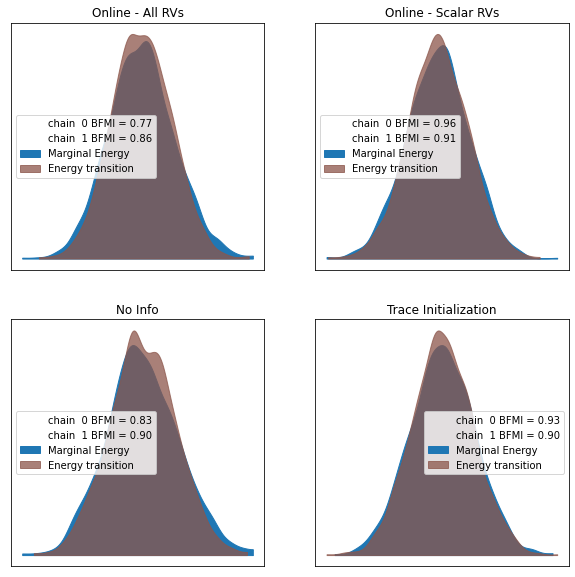

In [720]:
fig, ax = plt.subplots(2,2, figsize=(10,10))
az.plot_energy(trace_new, ax=ax[0,0])
az.plot_energy(trace_no_prior, ax=ax[1,0])
az.plot_energy(trace_trace_init, ax=ax[1,1])
az.plot_energy(trace_beta_posteriors, ax=ax[0,1])


ax[0,0].set_title('Online - All RVs')
ax[1,0].set_title('No Info')
ax[0,1].set_title('Online - Scalar RVs')
ax[1,1].set_title('Trace Initialization')
plt.show()

### Checking Prior Distributions

### Checking posterior on values

Latent R(t)

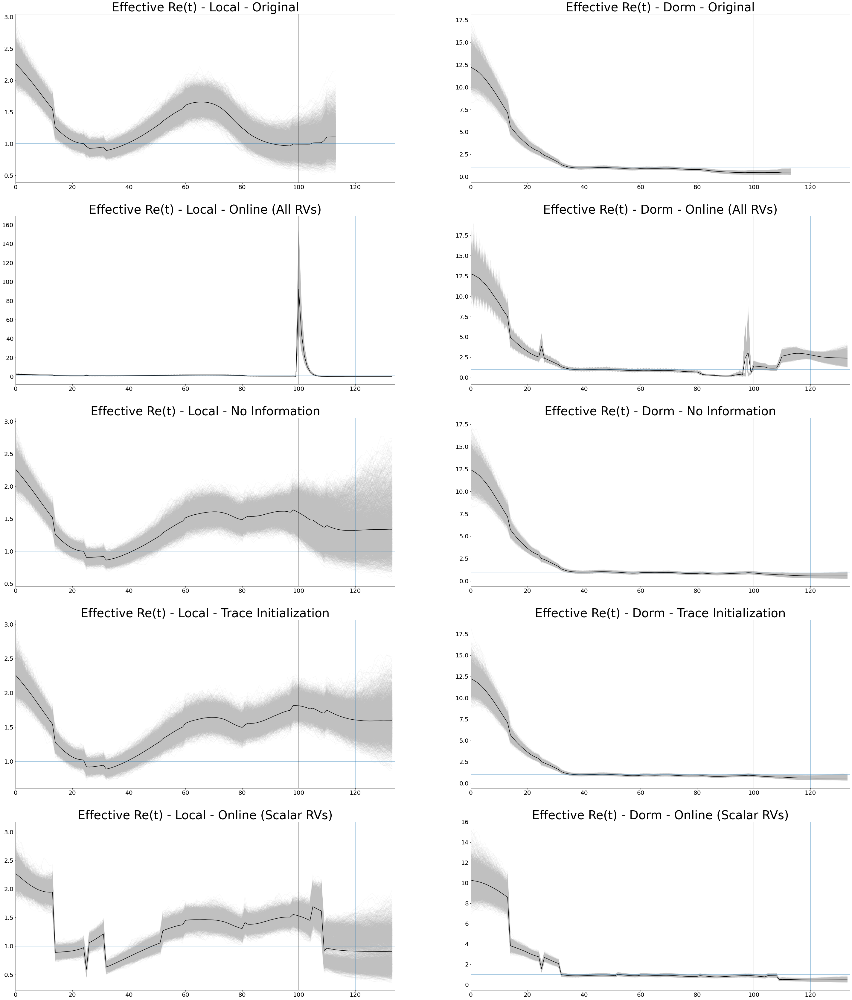

In [736]:

fig, ax = plt.subplots(5,2, figsize=(50,60))

trace1 = trace_new
trace2 = trace_no_prior
trace3 = trace_trace_init
trace4 = trace_beta_posteriors
end_date = 120
font_size=40
row_nos = [0,1,2,3,4]
traces = [trace_prev, trace1, trace2, trace3, trace4]
desc_list = ['Original', 'Online (All RVs)','No Information', 'Trace Initialization', 'Online (Scalar RVs)']
end_date_list = [100, 120, 120]

for r,tr,desc in zip(row_nos, traces, desc_list):
    
    ax[r,0].plot(tr['r_t_local'].T, c='silver', alpha=0.1)
    ax[r,0].plot(tr['r_t_local'].mean(0), c='black', alpha=1)
    ax[r,0].axhline(y=1, alpha=0.5)
    ax[r,0].axvline(x=100, alpha=0.5, c='k')
    ax[r,0].set_xlim(0,120+14)
    ax[r,0].set_title(f"Effective Re(t) - Local - {desc}", fontsize = font_size)
    ax[r,0].tick_params(axis='x', labelsize=20)
    ax[r,0].tick_params(axis='y', labelsize=20)
    
    ax[r,1].plot(tr['r_t_foreign'].T, c='silver', alpha=0.1)
    ax[r,1].plot(tr['r_t_foreign'].mean(0), c='black', alpha=1)
    ax[r,1].axhline(y=1, alpha=0.5)
    ax[r,1].axvline(x=100, alpha=0.5, c='k')
    ax[r,1].set_xlim(0,120+14)
    ax[r,1].set_title(f"Effective Re(t) - Dorm - {desc}", fontsize = font_size)
    ax[r,1].tick_params(axis='x', labelsize=20)
    ax[r,1].tick_params(axis='y', labelsize=20)
    
    if r > 0:
        ax[r,1].axvline(x=120, alpha=0.5)
        ax[r,0].axvline(x=120, alpha=0.5)


plt.show()

Quarantine Rate

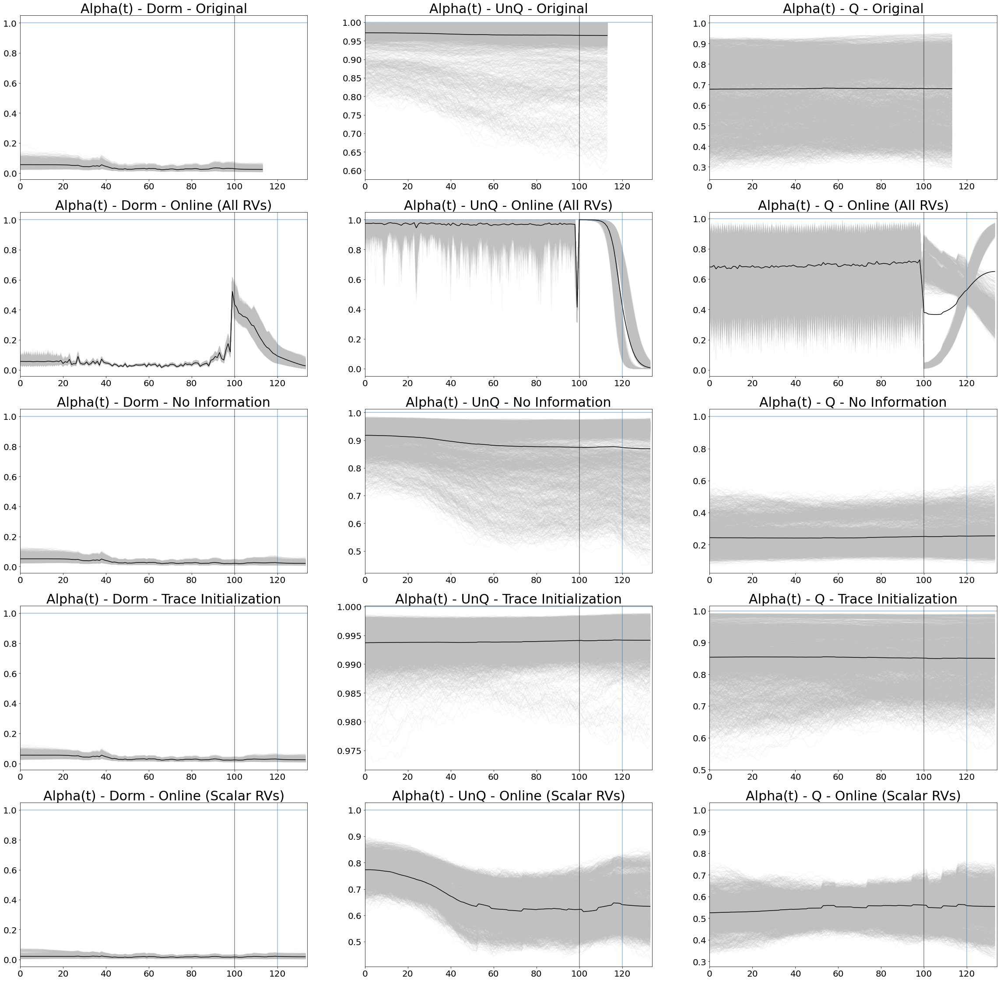

In [739]:
fig, ax = plt.subplots(5,3, figsize=(40,40))

trace1 = trace_new
trace2 = trace_no_prior
trace3 = trace_trace_init
trace4 = trace_beta_posteriors
end_date = 120
font_size=30
row_nos = [0,1,2,3,4]
traces = [trace_prev, trace1, trace2, trace3, trace4]
desc_list = ['Original', 'Online (All RVs)','No Information', 'Trace Initialization', 'Online (Scalar RVs)']
end_date_list = [100, 120, 120]

for r,tr,desc in zip(row_nos, traces, desc_list):
    
    ax[r,0].plot(tr['alpha_dorm_t'].T, c='silver', alpha=0.1)
    ax[r,0].plot(tr['alpha_dorm_t'].mean(0), c='black', alpha=1)
    ax[r,0].axhline(y=1, alpha=0.5)
    ax[r,0].axvline(x=100, alpha=0.5, c='k')
    ax[r,0].set_xlim(0,120+14)
    ax[r,0].set_title(f'Alpha(t) - Dorm - {desc}', fontsize=font_size)
    ax[r,0].tick_params(axis='x', labelsize=20)
    ax[r,0].tick_params(axis='y', labelsize=20)
    
    ax[r,1].plot(tr['alpha_local_unQ_t'].T, c='silver', alpha=0.1)
    ax[r,1].plot(tr['alpha_local_unQ_t'].mean(0), c='black', alpha=1)
    ax[r,1].axhline(y=1, alpha=0.5)
    ax[r,1].axvline(x=100, alpha=0.5, c='k')
    ax[r,1].set_xlim(0,120+14)
    ax[r,1].set_title(f'Alpha(t) - UnQ - {desc}', fontsize=font_size)
    ax[r,1].tick_params(axis='x', labelsize=20)
    ax[r,1].tick_params(axis='y', labelsize=20)
    
    ax[r,2].plot(tr['alpha_local_Q_t'].T, c='silver', alpha=0.1)
    ax[r,2].plot(tr['alpha_local_Q_t'].mean(0), c='black', alpha=1)
    ax[r,2].axhline(y=1, alpha=0.5)
    ax[r,2].axvline(x=100, alpha=0.5, c='k')
    ax[r,2].set_xlim(0,120+14)
    ax[r,2].set_title(f'Alpha(t) - Q - {desc}', fontsize=font_size)
    ax[r,2].tick_params(axis='x', labelsize=20)
    ax[r,2].tick_params(axis='y', labelsize=20)

    if r > 0:
        ax[r,0].axvline(x=120, alpha=0.5)
        ax[r,1].axvline(x=120, alpha=0.5)
        ax[r,2].axvline(x=120, alpha=0.5)

plt.show()

Quarantine Rate

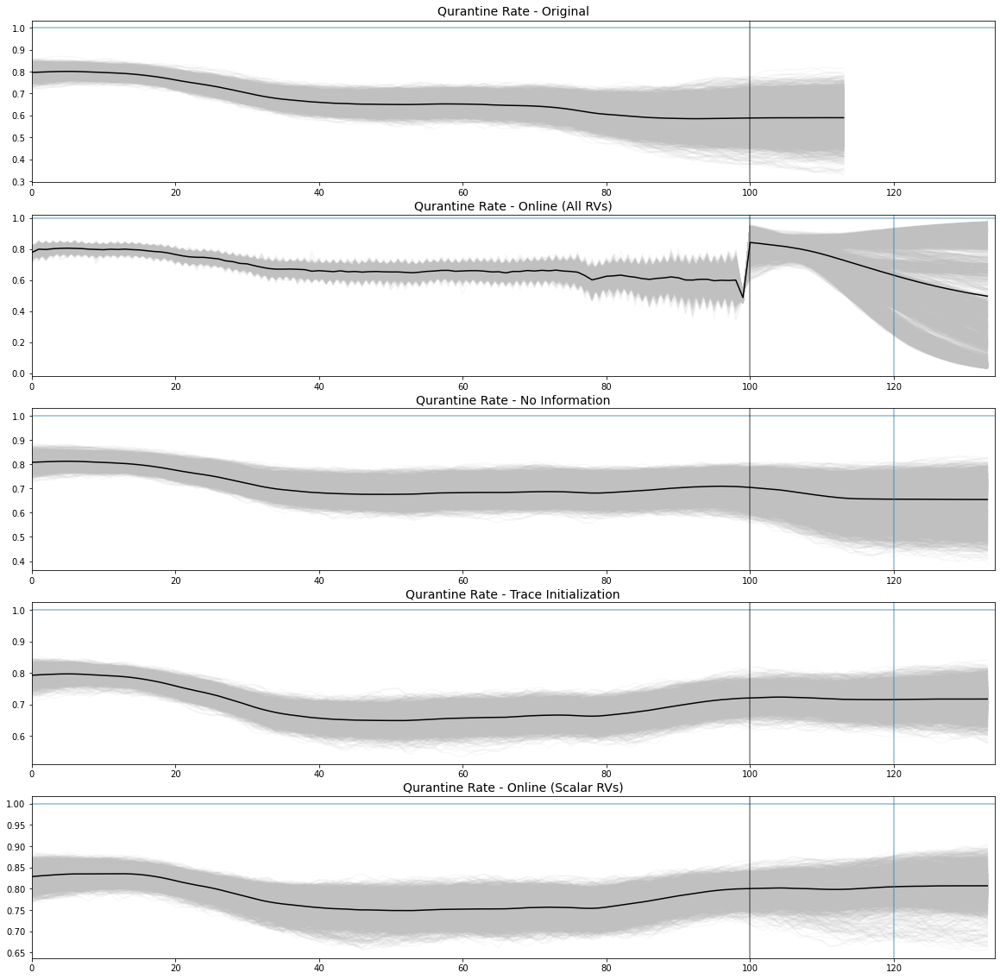

In [743]:
fig, ax = plt.subplots(5,1,figsize=(20,20))

trace1 = trace_new
trace2 = trace_no_prior
trace3 = trace_trace_init
trace4 = trace_beta_posteriors
end_date = 120
font_size=14
row_nos = [0,1,2,3,4]
traces = [trace_prev, trace1, trace2, trace3, trace4]
desc_list = ['Original', 'Online (All RVs)','No Information', 'Trace Initialization', 'Online (Scalar RVs)']
end_date_list = [100, 120, 120]

for r,tr,desc in zip(row_nos, traces, desc_list):

    ax[r].plot(tr['Q Rate'].T, c='silver', alpha=0.1)
    ax[r].plot(tr['Q Rate'].mean(0), c='black', alpha=1)
    ax[r].axhline(y=1, alpha=0.5)
    ax[r].axvline(x=100, alpha=0.5, c='k')
    ax[r].set_xlim(0,120+14)
    ax[r].set_title(f'Quarantine Rate - {desc}', fontsize=font_size)
    
    if r>0:
        ax[r].axvline(x=120, alpha=0.5)
    
plt.show()


Latents

In [537]:

# Import parmas
start_id = 50
end_date = 100
prediction_t = 14

val_run = False
separate_dorms = True
separate_quarantine = True

n_chains = 2
tune_steps = 1000
train_steps = 2000
t_accept = 0.99

# IMPORT DATA
local_cases1, dorm_cases1, imported_input, total_input, len_observed = generate_prediction_data(DATA_PATH, start_id=start_id,
                            end_date=end_date, prediction_t=prediction_t, imported_case_extra='ma',
                            separate_dorms=separate_dorms, separate_quarantine=separate_quarantine,
                            local_cases_breakdown_data_path=CASE_BREAKDOWN_PATH)

# Import parmas
start_id = 50
end_date = 120
prediction_t = 14

val_run = False
separate_dorms = True
separate_quarantine = True

n_chains = 2
tune_steps = 10
train_steps = 100
t_accept = 0.99

# IMPORT DATA
local_cases2, dorm_cases2, imported_input, total_input, len_observed = generate_prediction_data(DATA_PATH, start_id=start_id,
                            end_date=end_date, prediction_t=prediction_t, imported_case_extra='ma',
                            separate_dorms=separate_dorms, separate_quarantine=separate_quarantine,
                            local_cases_breakdown_data_path=CASE_BREAKDOWN_PATH)


# Get actual 
end_date = 134
all_cases_local, all_dorms, imported_input, total_input, len_observed = generate_prediction_data(DATA_PATH, start_id=start_id,
                            end_date=end_date, prediction_t=prediction_t, imported_case_extra='ma',
                            separate_dorms=separate_dorms, separate_quarantine=separate_quarantine,
                            local_cases_breakdown_data_path=CASE_BREAKDOWN_PATH)

imported cases ma
Length Community training cases:  114   114
Length Dorm training cases:  100
Length into model:  114   114   114
imported cases ma
Length Community training cases:  134   134
Length Dorm training cases:  120
Length into model:  134   134   134
imported cases ma
Length Community training cases:  148   148
Length Dorm training cases:  134
Length into model:  148   148   148


In [548]:
all_cases_local1 = [x[0:114] for x in all_cases_local]
all_cases_local2 = [x[0:134] for x in all_cases_local]

all_dorm_cases1 = all_dorms[0:114]
all_dorm_cases2 = all_dorms[0:134]

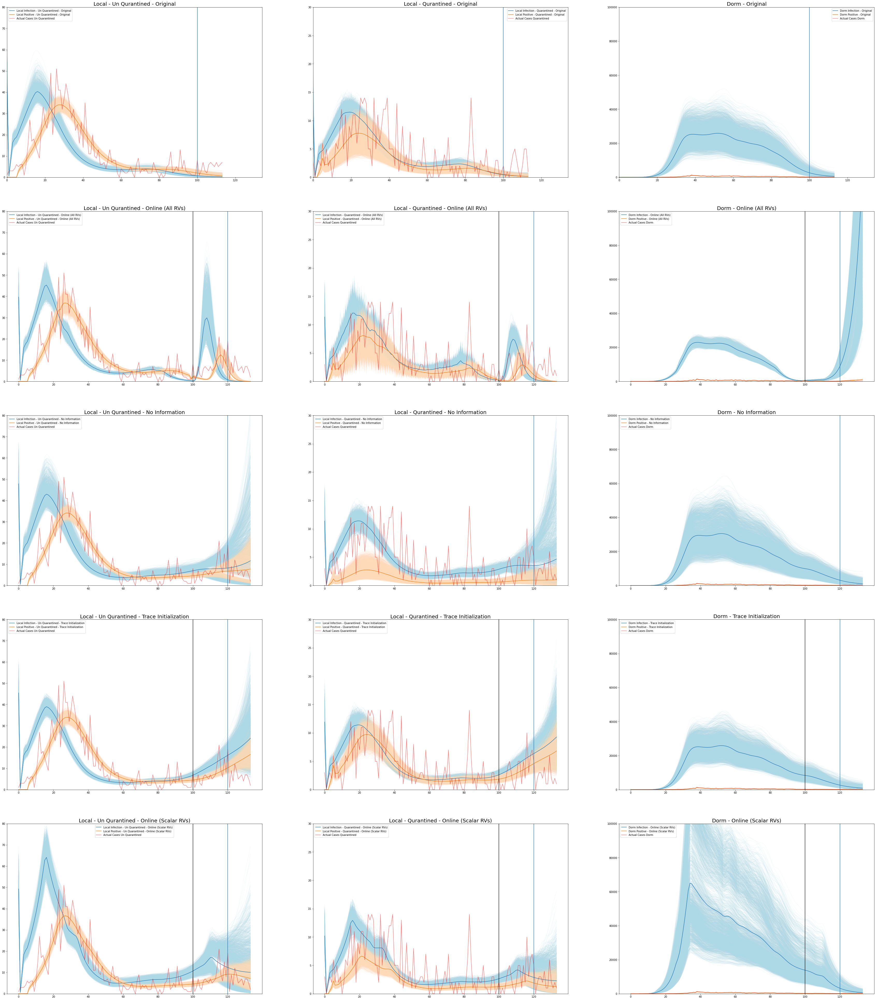

In [745]:
fig, ax = plt.subplots(5,3, figsize=(60,70))

trace1 = trace_new
trace2 = trace_no_prior
trace3 = trace_trace_init
trace4 = trace_beta_posteriors
font_size=20
row_nos = [0,1,2,3,4]
traces = [trace_prev, trace1, trace2, trace3, trace4]
desc_list = ['Original', 'Online (All RVs)','No Information', 'Trace Initialization', 'Online (Scalar RVs)']
local_c_list = [all_cases_local1, all_cases_local2, all_cases_local2, all_cases_local2, all_cases_local2]
dorm_c_list = [all_dorm_cases1, all_dorm_cases2, all_dorm_cases2, all_dorm_cases2, all_dorm_cases2]
end_date_list = [100, 120, 120, 120, 120]
for r, trace_i, desc, local_c, dorm_c, ed in zip(row_nos, traces,
                                                 desc_list, local_c_list, dorm_c_list, end_date_list):
    # Un quarantined
    ax[r, 0].plot(trace_i['infections_local_uncontained'].T, c='lightblue', alpha=0.1)
    ax[r, 0].plot(trace_i['test_adjusted_positive_jit_local'].T, c='peachpuff', alpha=0.1)
    ax[r, 0].plot(trace_i['infections_local_uncontained'].mean(0), label=f'Local Infection - Un Quarantined - {desc}')
    ax[r, 0].plot(trace_i['test_adjusted_positive_jit_local'].mean(0), label=f'Local Positive - Un Quarantined - {desc}')
    ax[r, 0].set_ylim(0,80)
    # Quarantined
    ax[r, 1].plot(trace_i['infections_local_contained'].T, c='lightblue', alpha=0.1)
    ax[r, 1].plot(trace_i['test_adjusted_positive_jit_local_qurantined'].T, c='peachpuff', alpha=0.1)
    ax[r, 1].plot(trace_i['infections_local_contained'].mean(0), label=f'Local Infection - Quarantined - {desc}')
    ax[r, 1].plot(trace_i['test_adjusted_positive_jit_local_qurantined'].mean(0), label=f'Local Positive - Quarantined - {desc}')
    ax[r, 1].set_ylim(0,30)
    # Dorm
    ax[r, 2].plot(trace_i['infections_dorm'].T, c='lightblue', alpha=0.1)
    ax[r, 2].plot(trace_i['test_adjusted_positive_jit_dorm'].T, c='peachpuff', alpha=0.1)
    ax[r, 2].plot(trace_i['infections_dorm'].mean(0), label=f'Dorm Infection - {desc}')
    ax[r, 2].plot(trace_i['test_adjusted_positive_jit_dorm'].mean(0), label=f'Dorm Positive - {desc}')
    ax[r, 2].set_ylim(0, 100000)

    if (False) and (False):
        ax[r, 0].plot(np.concatenate([self.local_cases[0:self.end_date], actual_local_only]), c='r', alpha=0.5)
        ax[r, 1].plot(np.concatenate([self.dorm_cases[0:self.end_date], actual_dorm_only]), c='r', alpha=0.5)
    else:
        ax[r, 0].plot(local_c[0], c='r', alpha=0.5, label='Actual Cases Un Quarantined')
        ax[r, 1].plot(local_c[1], c='r', alpha=0.5, label='Actual Cases Quarantined')
        ax[r, 2].plot(dorm_c, c='r', alpha=0.5, label='Actual Cases Dorm')  

    #ax.plot(imported_input, c='g')

    ax[r, 0].axvline(x=ed)
    ax[r, 1].axvline(x=ed)
    ax[r, 2].axvline(x=ed)

    ax[r, 0].legend()
    ax[r, 1].legend()
    ax[r, 2].legend()

    ax[r, 0].set_title(f'Local - Un Qurantined - {desc}', fontsize=font_size)
    ax[r, 1].set_title(f'Local - Qurantined - {desc}', fontsize=font_size)
    ax[r, 2].set_title(f'Dorm - {desc}', fontsize=font_size)
    
    if r == 0:
        ax[r, 0].set_xlim(0,120+14)
        ax[r, 1].set_xlim(0,120+14)
        ax[r, 2].set_xlim(0,120+14)
    
    if r in [1,3,4]:
        ax[r, 0].axvline(x=100, c='k')
        ax[r, 1].axvline(x=100, c='k')
        ax[r, 2].axvline(x=100, c='k')
plt.show()

RMSE Calc

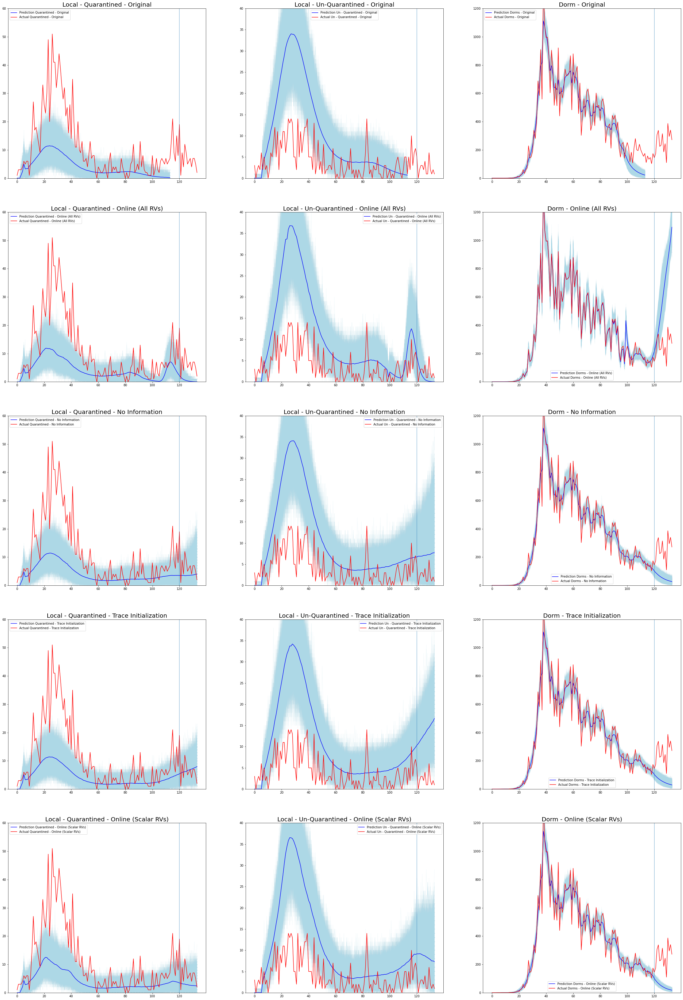

In [751]:
trace1 = trace_new
trace2 = trace_no_prior
trace3 = trace_trace_init
trace4 = trace_beta_posteriors

row_nos = [0,1,2,3,4]
traces = [trace_prev, trace1, trace2, trace3, trace4]
desc_list = ['Original', 'Online (All RVs)','No Information', 'Trace Initialization', 'Online (Scalar RVs)']
models = [model, model_new, model_unInf_prior, model_trace_init, model_betas_only]

train_time = 120
pred_t = 14

fig, ax = plt.subplots(5,3, figsize=(40,60))

for tr, tr_name,mod,i, desc in zip(traces, desc_list, models, row_nos, desc_list):
    
    
    with mod:
        ppc_trace = pm.sample_posterior_predictive(tr)
    
    #### Quarantined Cases test - train    
    # Plot 
    ax[i,0].plot(ppc_trace['Obs_local_q'][:,0:train_time+pred_t].T, c='lightblue', alpha=0.1)
    ax[i,0].plot(ppc_trace['Obs_local_q'][:,0:train_time+pred_t].mean(0),
                 c='b', alpha=1, label=f'Prediction Quarantined - {desc}')
    ax[i,0].plot(all_cases_local[0][0:train_time+pred_t].values, c='r',
                 alpha=1, label=f'Actual Quarantined - {desc}')
    
    #### Unquarantined Cases test - train
    # Plot 
    ax[i,1].plot(ppc_trace['Obs_local'][:,0:train_time+pred_t].T, c='lightblue', alpha=0.1)
    ax[i,1].plot(ppc_trace['Obs_local'][:,0:train_time+pred_t].mean(0),
                 c='b', alpha=1, label=f'Prediction Un - Quarantined - {desc}')
    ax[i,1].plot(all_cases_local[1][0:train_time+pred_t].values, c='r',
                 alpha=1, label=f'Actual Un - Quarantined - {desc}')
    
    #### Dorm Cases test - train
    # Plot
    ax[i,2].plot(ppc_trace['Obs_dorm'][:,0:train_time+pred_t].T, c='lightblue', alpha=0.1)
    ax[i,2].plot(ppc_trace['Obs_dorm'][:,0:train_time+pred_t].mean(0),
                 c='b', alpha=1, label=f'Prediction Dorms - {desc}')
    ax[i,2].plot(all_dorms[0:train_time+pred_t].values, c='r',
                 alpha=1, label=f'Actual Dorms - {desc}')
    
    ax[i, 0].legend()
    ax[i, 1].legend()
    ax[i, 2].legend()

    ax[i, 0].axvline(x=train_time, alpha=0.5)
    ax[i, 1].axvline(x=train_time, alpha=0.5)
    ax[i, 2].axvline(x=train_time, alpha=0.5)
    
    if desc == 'Online':
        ax[i, 0].axvline(x=100, alpha=0.5, c='k')
        ax[i, 1].axvline(x=100, alpha=0.5, c='k')
        ax[i, 2].axvline(x=100, alpha=0.5, c='k')
        
    ax[i, 0].set_ylim(0,60)
    ax[i, 1].set_ylim(0,40)
    ax[i, 2].set_ylim(0,1200)
    
    ax[i, 0].set_title(f'Local - Quarantined - {desc}', fontsize=font_size)
    ax[i, 1].set_title(f'Local - Un-Quarantined - {desc}', fontsize=font_size)
    ax[i, 2].set_title(f'Dorm - {desc}', fontsize=font_size)
    
plt.show()

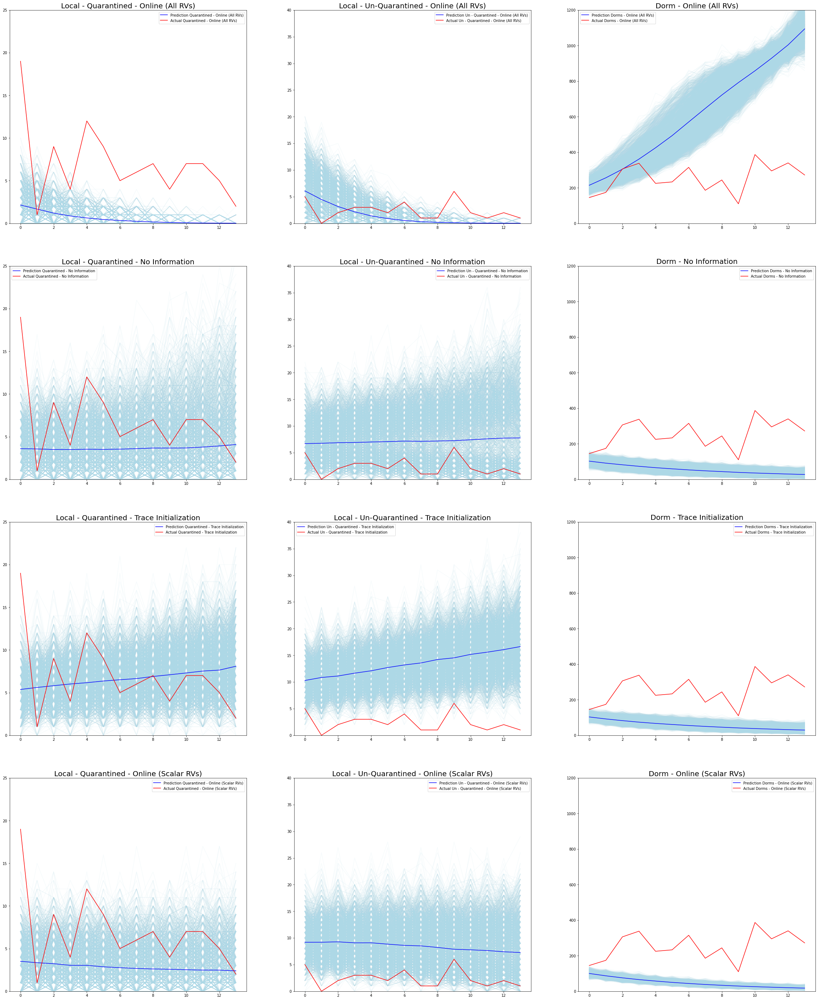

In [763]:
trace1 = trace_new
trace2 = trace_no_prior
trace3 = trace_trace_init
trace4 = trace_beta_posteriors

row_nos = [0,1,2,3]
traces = [trace1, trace2, trace3, trace4]
desc_list = ['Online (All RVs)','No Information', 'Trace Initialization', 'Online (Scalar RVs)']
models = [model_new, model_unInf_prior, model_trace_init, model_betas_only]


train_time = 120
pred_t = 14
fig, ax = plt.subplots(4,3, figsize=(40,50))

rmse_figs = {}

for tr, tr_name, mod,i, desc in zip(traces, desc_list, models, row_nos, desc_list):
    
    
    with mod:
        ppc_trace = pm.sample_posterior_predictive(tr)
    
    #### Quarantined Cases test - train
    Q_pred_mean_test = ppc_trace['Obs_local_q'].mean(0)[train_time:train_time+pred_t]
    Q_actual_test =  all_cases_local[0][train_time:train_time+pred_t]

    Q_pred_mean_train = ppc_trace['Obs_local_q'].mean(0)[0:train_time]
    Q_actual_train =  all_cases_local[0][0:train_time]
    
    # Plot 
    ax[i,0].plot(ppc_trace['Obs_local_q'][:,train_time:train_time+pred_t].T, c='lightblue', alpha=0.1)
    ax[i,0].plot(ppc_trace['Obs_local_q'][:,train_time:train_time+pred_t].mean(0),
                 c='b', alpha=1, label=f'Prediction Quarantined - {desc}')
    ax[i,0].plot(all_cases_local[0][train_time:train_time+pred_t].values, c='r',
                 alpha=1, label=f'Actual Quarantined - {desc}')
    
    #### Unquarantined Cases test - train
    unQ_pred_mean_test = ppc_trace['Obs_local'].mean(0)[train_time:train_time+pred_t]
    unQ_actual_test = all_cases_local[1][train_time:train_time+pred_t]
    
    unQ_pred_mean_train = ppc_trace['Obs_local'].mean(0)[0:train_time]
    unQ_actual_train = all_cases_local[1][0:train_time]

     # Plot 
    ax[i,1].plot(ppc_trace['Obs_local'][:,train_time:train_time+pred_t].T, c='lightblue', alpha=0.1)
    ax[i,1].plot(ppc_trace['Obs_local'][:,train_time:train_time+pred_t].mean(0),
                 c='b', alpha=1, label=f'Prediction Un - Quarantined - {desc}')
    ax[i,1].plot(all_cases_local[1][train_time:train_time+pred_t].values, c='r',
                 alpha=1, label=f'Actual Un - Quarantined - {desc}')
    
    #### Dorm Cases test - train
    dorm_pred_mean_test = ppc_trace['Obs_dorm'].mean(0)[train_time:train_time+pred_t]
    dorm_actual_test = all_dorms[train_time:train_time+pred_t]
    
    dorm_pred_mean_train = ppc_trace['Obs_dorm'].mean(0)[0:train_time]
    dorm_actual_train = all_dorms[0:train_time]
                 
    # Plot 
    ax[i,2].plot(ppc_trace['Obs_dorm'][:,train_time:train_time+pred_t].T, c='lightblue', alpha=0.1)
    ax[i,2].plot(ppc_trace['Obs_dorm'][:,train_time:train_time+pred_t].mean(0),
                 c='b', alpha=1, label=f'Prediction Dorms - {desc}')
    ax[i,2].plot(all_dorms[train_time:train_time+pred_t].values, c='r',
                 alpha=1, label=f'Actual Dorms - {desc}')
    
    ax[i, 0].legend()
    ax[i, 1].legend()
    ax[i, 2].legend()
    
    ax[i, 0].set_ylim(0,25)
    ax[i, 1].set_ylim(0,40)
    ax[i, 2].set_ylim(0,1200)
    
    ax[i, 0].set_title(f'Local - Quarantined - {desc}', fontsize=font_size)
    ax[i, 1].set_title(f'Local - Un-Quarantined - {desc}', fontsize=font_size)
    ax[i, 2].set_title(f'Dorm - {desc}', fontsize=font_size)
    
    rmse_figs[desc] = {"Quarantined Train": Q_pred_mean_train - Q_actual_train,
                        "Quarantined Test": Q_pred_mean_test - Q_actual_test,
                       "UnQuarantined Train": unQ_pred_mean_train - unQ_actual_train,
                       "UnQuaratined Test": unQ_pred_mean_test - unQ_actual_test,
                       "Dorm Train": dorm_pred_mean_train - dorm_actual_train,
                       "Dorm Test": dorm_pred_mean_test - dorm_actual_test
                      }
    
plt.show()

#### Residual Plots

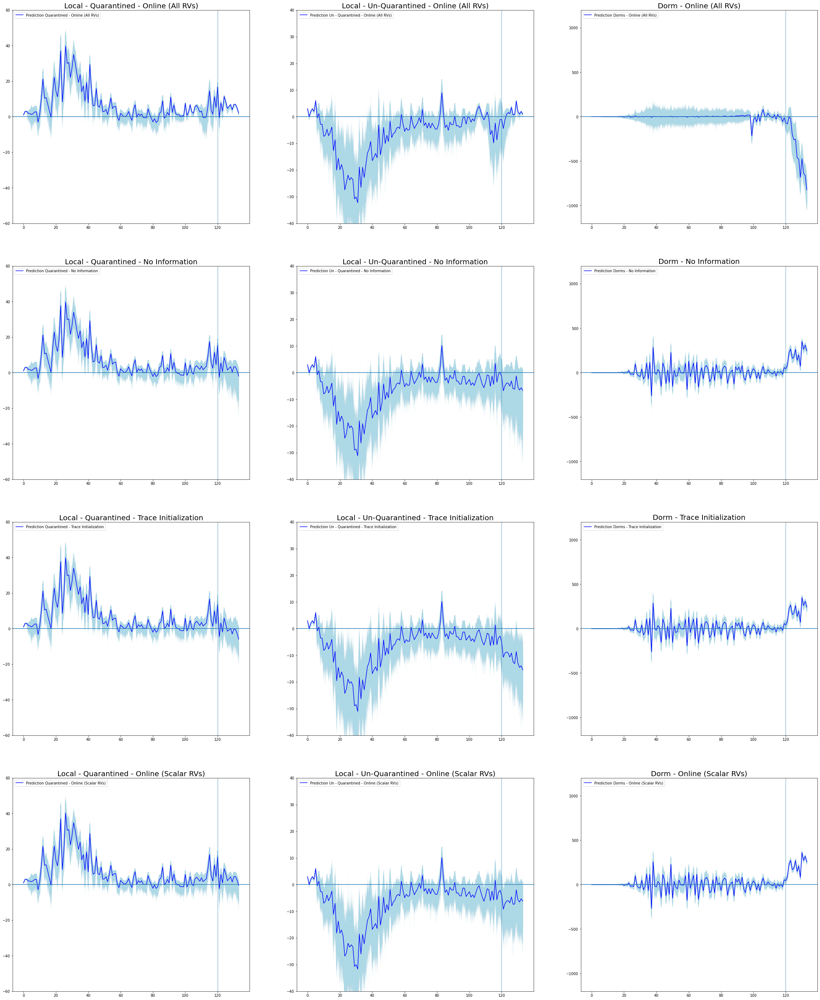

In [764]:
trace1 = trace_new
trace2 = trace_no_prior
trace3 = trace_trace_init
trace4 = trace_beta_posteriors

row_nos = [0,1,2,3]
traces = [trace1, trace2, trace3, trace4]
desc_list = ['Online (All RVs)','No Information', 'Trace Initialization', 'Online (Scalar RVs)']
models = [model_new, model_unInf_prior, model_trace_init, model_betas_only]

train_time = 120
pred_t = 14
fig, ax = plt.subplots(4,3, figsize=(40,50))
num_samps = 3000

for tr, tr_name,mod,i, desc in zip(traces, desc_list, models, row_nos, desc_list):
    
    
    with mod:
        ppc_trace = pm.sample_posterior_predictive(tr)
    
    #### Quarantined Cases test - train    
    # Plot 
    ax[i,0].plot(np.tile(all_cases_local[0][0:train_time+pred_t].values, (num_samps,1)).T - ppc_trace['Obs_local_q'][:,0:train_time+pred_t].T, c='lightblue', alpha=0.1)
    ax[i,0].plot(all_cases_local[0][0:train_time+pred_t].values - ppc_trace['Obs_local_q'][:,0:train_time+pred_t].mean(0),
                 c='b', alpha=1, label=f'Prediction Quarantined - {desc}')
    
    #### Unquarantined Cases test - train
    # Plot 
    ax[i,1].plot(np.tile(all_cases_local[1][0:train_time+pred_t].values, (num_samps,1)).T - ppc_trace['Obs_local'][:,0:train_time+pred_t].T, c='lightblue', alpha=0.1)
    ax[i,1].plot(all_cases_local[1][0:train_time+pred_t].values - ppc_trace['Obs_local'][:,0:train_time+pred_t].mean(0),
                 c='b', alpha=1, label=f'Prediction Un - Quarantined - {desc}')

    #### Dorm Cases test - train
    # Plot
    ax[i,2].plot(np.tile(all_dorms[0:train_time+pred_t].values, (num_samps,1)).T - ppc_trace['Obs_dorm'][:,0:train_time+pred_t].T, c='lightblue', alpha=0.1)
    ax[i,2].plot(all_dorms[0:train_time+pred_t].values - ppc_trace['Obs_dorm'][:,0:train_time+pred_t].mean(0),
                 c='b', alpha=1, label=f'Prediction Dorms - {desc}')

    
    ax[i, 0].legend()
    ax[i, 1].legend()
    ax[i, 2].legend()

    ax[i, 0].axvline(x=train_time, alpha=0.5)
    ax[i, 1].axvline(x=train_time, alpha=0.5)
    ax[i, 2].axvline(x=train_time, alpha=0.5)

    if desc == 'Online':
        ax[i, 0].axvline(x=100, alpha=0.5, c='k')
        ax[i, 1].axvline(x=100, alpha=0.5, c='k')
        ax[i, 2].axvline(x=100, alpha=0.5, c='k')
        
    ax[i, 0].axhline(y=0, alpha=1)
    ax[i, 1].axhline(y=0, alpha=1)
    ax[i, 2].axhline(y=0, alpha=1)
    
    
    ax[i, 0].set_ylim(-60,60)
    ax[i, 1].set_ylim(-40,40)
    ax[i, 2].set_ylim(-1200,1200)
    
    ax[i, 0].set_title(f'Local - Quarantined - {desc}', fontsize=font_size)
    ax[i, 1].set_title(f'Local - Un-Quarantined - {desc}', fontsize=font_size)
    ax[i, 2].set_title(f'Dorm - {desc}', fontsize=font_size)
    
plt.show()

RMSE

In [761]:
rmse_table = {}
for desc in rmse_figs.keys():
    rmse_table[desc] = {}
    for k in rmse_figs[desc].keys():
        rmse_table[desc][k] = np.sqrt(np.mean((rmse_figs[desc][k]**2)))
        

In [762]:
pd.DataFrame.from_dict(rmse_table)

,Online (All RVs),No Information,Trace Initialization,Online (Scalar RVs)
Quarantined Train,11.631538,11.644280,11.611642,11.680359
Quarantined Test,7.550578,5.501723,4.751560,5.885884
UnQuarantined Train,10.761885,10.264576,10.305617,10.588597
UnQuaratined Test,2.457022,5.125798,11.378341,6.269463
Dorm Train,24.524964,73.497015,73.579534,72.403448
Dorm Test,449.595853,218.157713,216.568354,226.196019


### Fit Statistics on Coefficients Variables
- Betas

In [829]:
# Import parmas
start_id = 50
end_date = 511
prediction_t = 14

val_run = False
separate_dorms = True
separate_quarantine = True

n_chains = 2
tune_steps = 1000
train_steps = 2000
t_accept = 0.99

# IMPORT DATA
community_input, dorm_input, imported_input, total_input, len_observed = generate_prediction_data(DATA_PATH, start_id=start_id,
                            end_date=end_date, prediction_t=prediction_t, imported_case_extra='ma',
                            separate_dorms=separate_dorms, separate_quarantine=separate_quarantine,
                            local_cases_breakdown_data_path=CASE_BREAKDOWN_PATH)

if val_run:
    com_gt, dorm_gt, import_gt, total_gt = generate_ground_truth_forecast(DATA_PATH, start_id=start_id,
                        end_date=end_date, prediction_t=prediction_t)


NPIS_array, date_ver = generate_NPI_prediction_data(NPI_PATH, start_id=start_id, end_date=end_date, prediction_t=prediction_t)

num_NPIS = NPIS_array.shape[1]
get_isolation_data_model, get_test_positivity_data_model

if separate_quarantine:
    quarantine_stats = get_isolation_data_model(SHN_DATA_PATH, QUARANTINE_DATA_PATH,
                     DATA_PATH, start_id, end_date,
                     shn_start_val=0, prediction_t=prediction_t,
                     quarantine_start_val=0, scale=True,extrapolate_type='ma')

    test_stats = get_test_positivity_data_model(TESTS_COUNTS_OWID_PATH, TEST_COUNTS_REPO_PATH,
                          DATA_PATH, start_id,
                          end_date, prediction_t=prediction_t, start_val=100, scale=True,
                          extrapolate_type='ma')
else:
    quarantine_stats = None
    test_stats = None
    
    
local_cases=community_input
dorm_cases=dorm_input
imported_cases=imported_input
NPIS_array=NPIS_array
len_observed=len_observed
total_cases=None
separate_dorms=separate_dorms
separate_quarantine=separate_quarantine
test_counts=test_stats
quarantine_counts=quarantine_stats
prediction_t=prediction_t
likelihood_fun='PO'

convolution_ready_gt = _get_convolution_ready_gt(len_observed)
delay = pd.read_csv("data/p_delay.csv")
p_delay = np.array(delay)
p_delay[0:6] = [0.0001]

imported cases ma
Length Community training cases:  525   525
Length Dorm training cases:  511
Length into model:  525   525   525
imported cases ma
imported cases ma


In [830]:
data_path = DATA_PATH

In [831]:
data = pd.read_csv(data_path)
data = data.rename(columns={'Unnamed: 0':'Date'})
data['total_cases'] = data['Community Total Cases'] + data['Dormitory Residents Total Cases']
data['Date'] = pd.to_datetime(data['Date'])

dates = data['Date'].values[start_id:]
community_cases = data['Community Total Cases'].values[start_id:]
dorm_cases = data['Dormitory Residents Total Cases'].values[start_id:]
total_cases = data['total_cases'].values[start_id:]
imported_cases = data['Imported Cases'].values[start_id:]

In [832]:
train_dates = dates[0:end_date]
train_local_cases = community_cases[0:end_date]
train_dorm_cases = dorm_cases[0:end_date]
train_imported_cases = imported_cases[0:end_date]
train_total_cases = total_cases[0:end_date]

In [833]:
train_dates[-1]

numpy.datetime64('2021-08-05T00:00:00.000000000')

In [834]:
community_input[0]

0      1.0
1      3.0
2      3.0
3      3.0
4      4.0
      ... 
520    NaN
521    NaN
522    NaN
523    NaN
524    NaN
Length: 525, dtype: float64

dates: 
- '2021-07-08'
- '2021-07-15'
- '2021-07-22'
- '2021-07-29'
- '2021-08-05'